Importing Dataset

**Source for dataset:**
Riedman, David (2023). K-12 School Shooting Database.

This Dataset contains 4 sheets

1. Incident
2. Shooter
3. Victim
4. Weapon

Importing Required Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# File Path Stored in Google Drive
# file_path ="/content/drive/MyDrive/CISC:5800 - Machine Learning /Public v3.1 K-12 School Shooting Database (9 25 2023).xlsx"

file_path = "Public v3.1 K-12 School Shooting Database (9 25 2023).xlsx"

# Loading Individual Sheets
incident_df = pd.read_excel(file_path, sheet_name='Incident')
shooter_df = pd.read_excel(file_path, sheet_name='Shooter')
victim_df = pd.read_excel(file_path, sheet_name='Victim')
weapon_df = pd.read_excel(file_path, sheet_name='Weapon')

### Section 1:Cleaning Individual Sheets

1. Shooter Sheet - Going through Shooter sheet, Data Cleaning

In [ ]:
shooter_df = shooter_df.rename(columns = {'Age': 'Shooter_Age', 'Gender':'Shooter_Gender', 'Race' : 'Shooter_Race',
                                          'School_Affiliation' : 'Shooter_School_Affiliation', 'Injury' : 'Shooter_Injury'})

In [ ]:
for col in shooter_df.columns[1:]:
  print(shooter_df[col].value_counts(dropna=False))
  print('\n')

NaN      551
Adult    290
Teen     286
17       263
16       239
        ... 
64         1
5          1
69         1
78         1
72         1
Name: Shooter_Age, Length: 70, dtype: int64


Male           2154
NaN             539
Female           96
Transgender       2
Multiple          2
Name: Shooter_Gender, dtype: int64


NaN                              2077
Black                             357
White                             245
Hispanic                           87
Asian                              14
Other                               6
Native American/Alaska Native       4
Hawaiian/Pacific Islander           2
Middle Eastern                      1
Name: Shooter_Race, dtype: int64


Student                                                1080
No Relation                                             555
Unknown                                                 331
NaN                                                     290
Nonstudent Using Athletic Facilities/Attending Game     1

i) Age

In [ ]:
def categorize_age(age):
    if pd.isna(age) or isinstance(age, str) and age not in ['Teen', 'Adult']:
        return 'Unknown'
    elif age == 'Teen' or (isinstance(age, int) and 13 <= age <= 19):
        return 'Teen'
    elif age == 'Adult' or (isinstance(age, int) and 20 <= age < 60):
        return 'Adult'
    elif isinstance(age, int) and age >= 60:
        return 'Old_Age'
    else:
        return 'Unknown'

shooter_df['Shooter_Age'] = shooter_df['Shooter_Age'].apply(categorize_age)

ii) Gender

In [ ]:
shooter_df['Shooter_Gender'] = shooter_df['Shooter_Gender'].fillna('Unknown')
shooter_df['Shooter_Gender'] = shooter_df['Shooter_Gender'].replace({'Transgender': 'Other', 'Multiple': 'Other'})

iii) Race

In [ ]:
shooter_df['Shooter_Race'] = shooter_df['Shooter_Race'].replace({'Other': 'Other/Minority', 'Native American/Alaska Native': 'Other/Minority',
                                                            'Hawaiian/Pacific Islander': 'Other/Minority', 'Middle Eastern': 'Other/Minority'})

shooter_df['Shooter_Race'] = shooter_df['Shooter_Race'].fillna('Unknown')

iv) Race

In [ ]:
def categorize_school_affiliation(affiliation):
    if affiliation in ['Student', 'Former Student', 'Other Student', 'Rival School Student']:
        return 'Student/Former_Student'
    elif affiliation in ['Teacher', 'Principal/Vice-Principal', 'Former Teacher', 'Other Staff']:
        return 'Staff/Former_Staff'
    elif affiliation in ['Parent', 'Relative', 'Intimate Relationship', 'Friend']:
        return 'Family/Intimate'
    elif affiliation in ['No Relation', 'Nonstudent', 'Nonstudent Using Athletic Facilities/Attending Game', 'Gang Member', 'Hitman']:
        return 'No_School_Relation'
    elif affiliation in ['Security Guard', 'Police Officer/SRO']:
        return 'Law_Enforcement'
    elif affiliation == 'Unknown':
        return 'Unknown'
    else:
        return 'Other'

shooter_df['Shooter_School_Affiliation'] = shooter_df['Shooter_School_Affiliation'].apply(categorize_school_affiliation)

v) Outcome

In [ ]:
def categorize_shooter_outcome(outcome):
    if outcome in ['Fled/Apprehended', 'Fled/Escaped']:
        return 'Fled'
    elif outcome in ['Apprehended/Killed by LE', 'Apprehended/Killed by SRO', 'Apprehended/Killed by Other']:
        return 'Apprehended/Killed'
    elif outcome in ['Suicide', 'Attempted Suicide']:
        return 'Suicide/Attempted Suicide'
    elif outcome == 'Subdued by Students/Staff/Other':
        return 'Subdued'
    elif outcome == 'Surrendered':
        return 'Surrendered'
    elif outcome == 'Law Enforcement':
        return 'Law Enforcement'
    elif outcome in ['Unknown', 'Other', None]:
        return 'Other/Unknown'
    else:
        return outcome


shooter_df['Shooter_Outcome'] = shooter_df['Shooter_Outcome'].apply(categorize_shooter_outcome)

In [ ]:
shooter_df['Shooter_Outcome'] = shooter_df['Shooter_Outcome'].fillna('Other/Unknown')

vi) Shooter Died

In [ ]:
shooter_df['Shooter_Died'] = shooter_df['Shooter_Died'].fillna('Unknown')

vii) Shooter Injury

In [ ]:
shooter_df['Shooter_Injury'] = shooter_df['Shooter_Injury'].fillna('Unknown')

shooter_df['Shooter_Injury'] = shooter_df['Shooter_Injury'].replace('None', 'No_Injury')

In [ ]:
shooter_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2793 entries, 0 to 2792
Data columns (total 8 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Incident_ID                 2793 non-null   object
 1   Shooter_Age                 2793 non-null   object
 2   Shooter_Gender              2793 non-null   object
 3   Shooter_Race                2793 non-null   object
 4   Shooter_School_Affiliation  2793 non-null   object
 5   Shooter_Outcome             2793 non-null   object
 6   Shooter_Died                2793 non-null   object
 7   Shooter_Injury              2793 non-null   object
dtypes: object(8)
memory usage: 174.7+ KB


In [ ]:
for col in shooter_df.columns[1:]:
  print(col)
  print(shooter_df[col].value_counts(dropna=False))
  print('\n')

Shooter_Age
Teen       1455
Adult       669
Unknown     646
Old_Age      23
Name: Shooter_Age, dtype: int64


Shooter_Gender
Male       2154
Unknown     539
Female       96
Other         4
Name: Shooter_Gender, dtype: int64


Shooter_Race
Unknown           2077
Black              357
White              245
Hispanic            87
Asian               14
Other/Minority      13
Name: Shooter_Race, dtype: int64


Shooter_School_Affiliation
Student/Former_Student    1218
No_School_Relation         724
Unknown                    331
Other                      290
Family/Intimate            125
Law_Enforcement             57
Staff/Former_Staff          48
Name: Shooter_School_Affiliation, dtype: int64


Shooter_Outcome
Fled                         1888
Apprehended/Killed            240
Surrendered                   220
Suicide/Attempted Suicide     216
Other/Unknown                 136
Subdued                        52
Law Enforcement                41
Name: Shooter_Outcome, dtype: int64


Sho

Creating aggregate function

In [ ]:
def aggregate_categorical(column):
  if len(column.unique()) > 1:
    return 'Multiple'
  else:
    return column.iloc[0]

In [ ]:
col_agg = shooter_df.columns[1:]
shooter_agg = shooter_df.groupby('Incident_ID').agg({col: aggregate_categorical for col in col_agg})
shooter_agg['No_of_Shooters'] = shooter_df.groupby('Incident_ID').size()
shooter_agg = shooter_agg.reset_index()

In [ ]:
shooter_agg['No_of_Shooters'].unique()

array([1, 2, 8, 3, 6, 4, 5])

In [ ]:
shooter_agg.head()

,Incident_ID,Shooter_Age,Shooter_Gender,Shooter_Race,Shooter_School_Affiliation,Shooter_Outcome,Shooter_Died,Shooter_Injury,No_of_Shooters
0,19660311NCIRC,Adult,Male,Unknown,No_School_Relation,Apprehended/Killed,No,No_Injury,1
1,19660314TXCAW,Adult,Male,White,Law_Enforcement,Law Enforcement,No,No_Injury,1
2,19660324CACAM,Adult,Male,Unknown,Staff/Former_Staff,Subdued,Yes,Fatal,1
3,19660328CAJOL,Adult,Male,White,Law_Enforcement,Law Enforcement,No,No_Injury,1
4,19660427NYBAB,Teen,Male,White,Student/Former_Student,Other/Unknown,No,No_Injury,1


In [ ]:
shooter_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2507 entries, 0 to 2506
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Incident_ID                 2507 non-null   object
 1   Shooter_Age                 2507 non-null   object
 2   Shooter_Gender              2507 non-null   object
 3   Shooter_Race                2507 non-null   object
 4   Shooter_School_Affiliation  2507 non-null   object
 5   Shooter_Outcome             2507 non-null   object
 6   Shooter_Died                2507 non-null   object
 7   Shooter_Injury              2507 non-null   object
 8   No_of_Shooters              2507 non-null   int64 
dtypes: int64(1), object(8)
memory usage: 176.4+ KB


In [ ]:
shooter_agg.describe(include='object')

,Incident_ID,Shooter_Age,Shooter_Gender,Shooter_Race,Shooter_School_Affiliation,Shooter_Outcome,Shooter_Died,Shooter_Injury
count,2507,2507,2507,2507,2507,2507,2507,2507
unique,2507,5,5,7,8,8,4,6
top,19660311NCIRC,Teen,Male,Unknown,Student/Former_Student,Fled,No,No_Injury
freq,1,1260,1909,1877,1114,1637,2266,2155


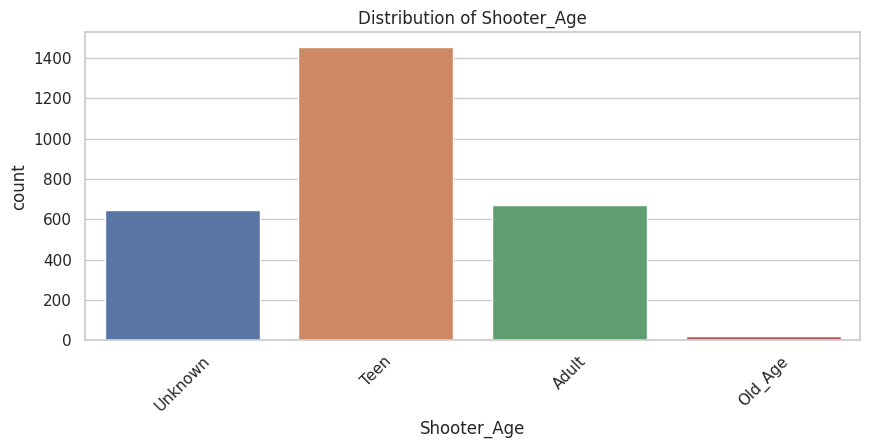

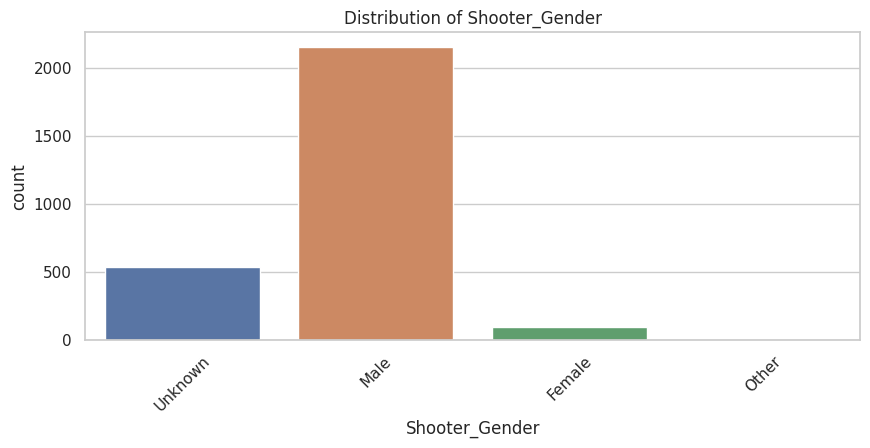

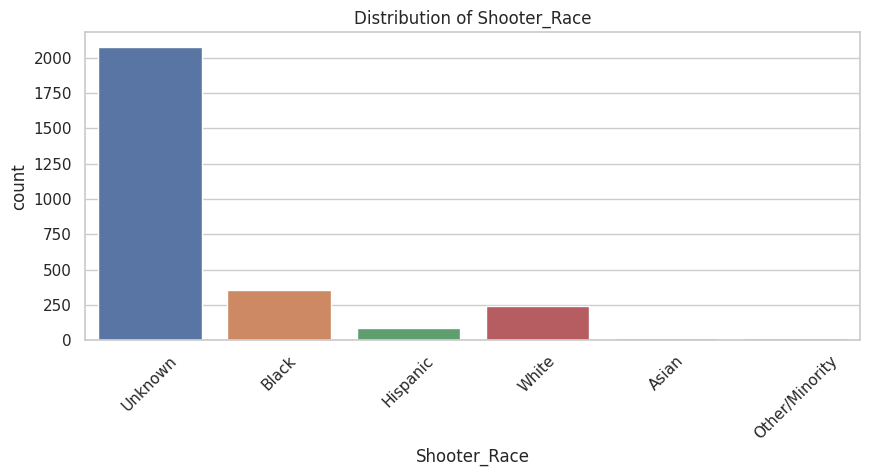

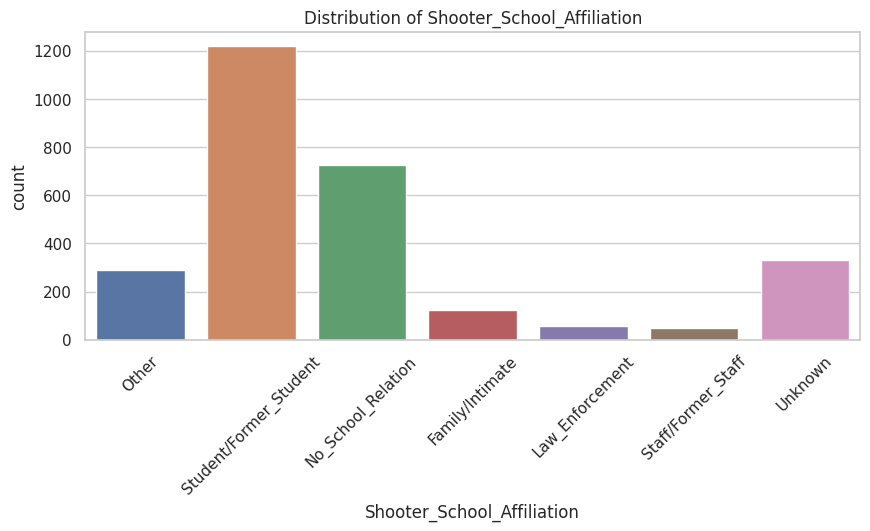

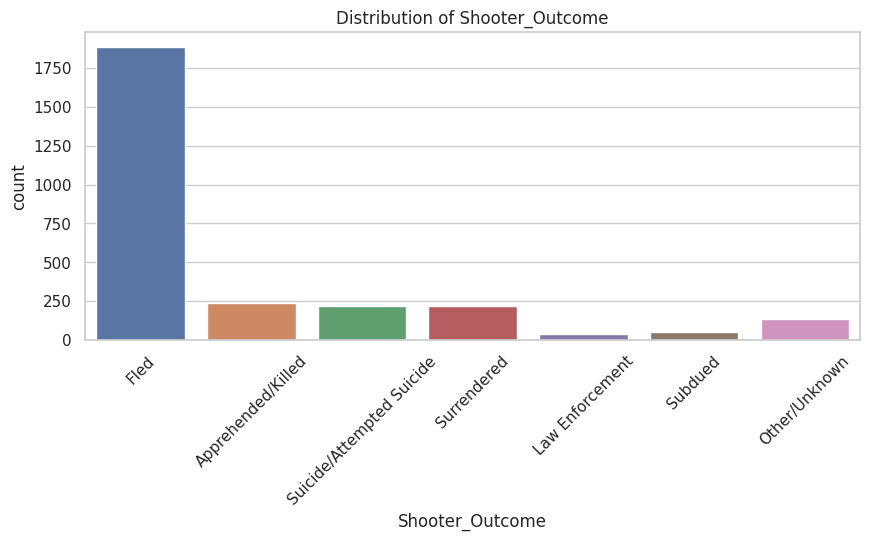

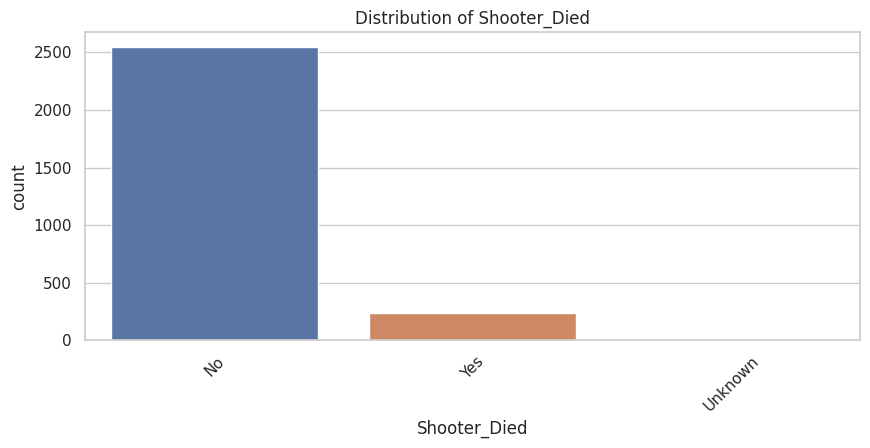

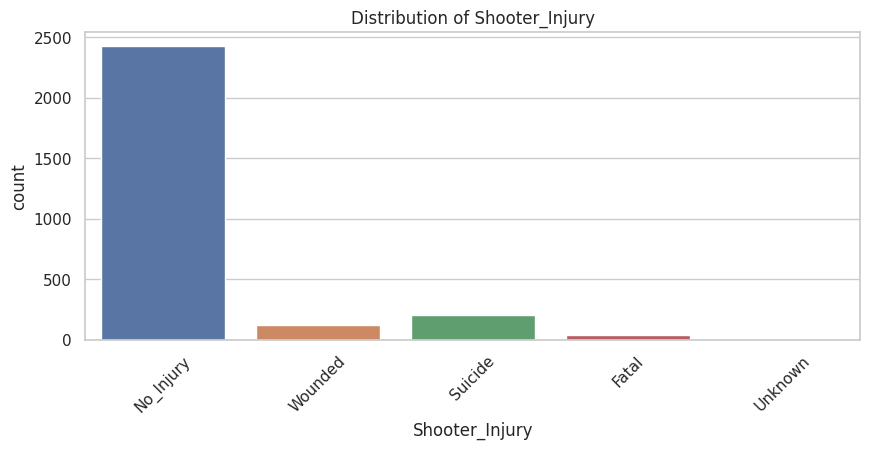

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

categorical_columns = ['Shooter_Age', 'Shooter_Gender', 'Shooter_Race', 'Shooter_School_Affiliation', 'Shooter_Outcome', 'Shooter_Died', 'Shooter_Injury']
for col in categorical_columns:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=col, data=shooter_df)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()

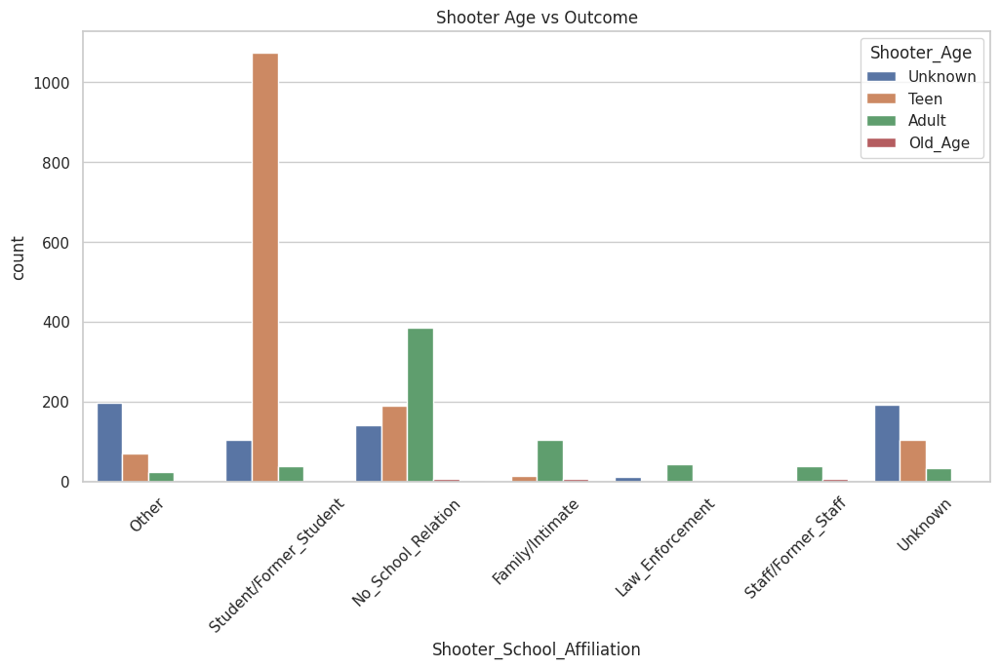

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Shooter_School_Affiliation', hue='Shooter_Age', data=shooter_df)
plt.title('Shooter Age vs Outcome')
plt.xticks(rotation=45)
plt.show()

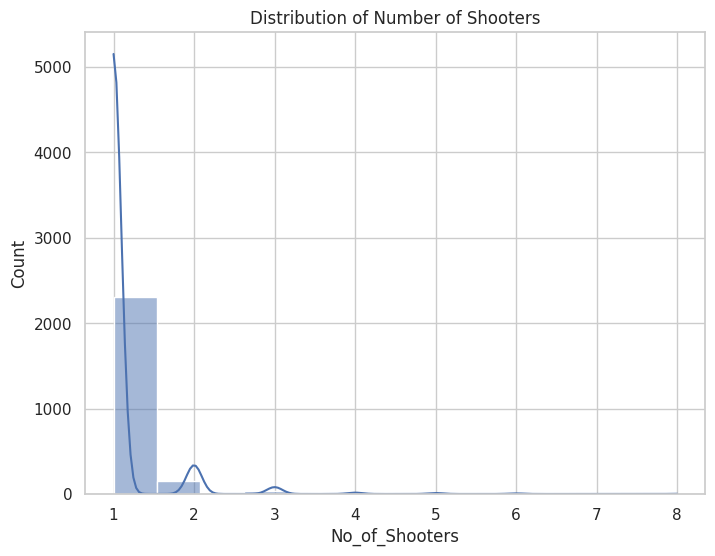

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(shooter_agg['No_of_Shooters'], kde=True)
plt.title('Distribution of Number of Shooters')
plt.show()

In [ ]:
df1 = incident_df.copy()
df1 = df1.merge(shooter_agg, on = 'Incident_ID', how = 'left')

No of Incidents over time

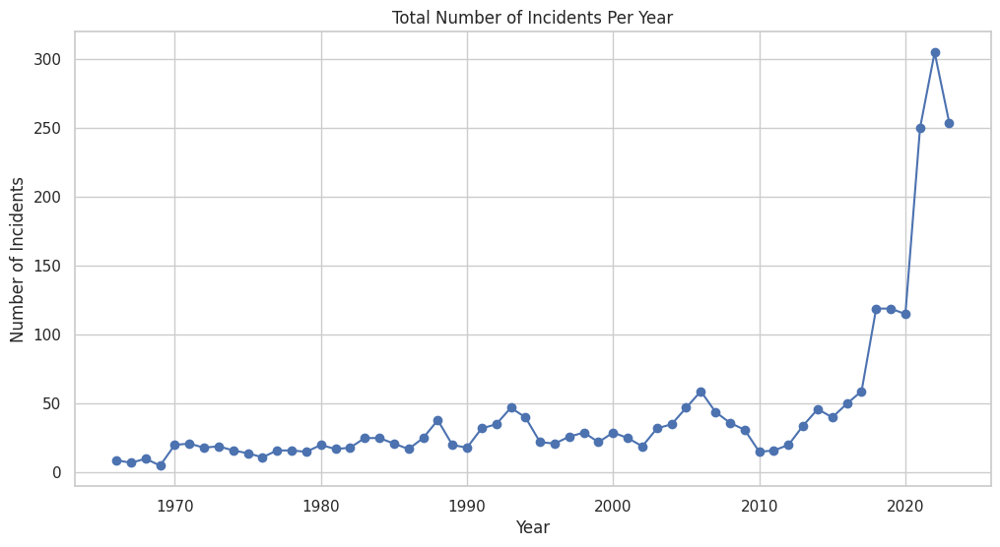

In [ ]:
incidents_per_year = df1.groupby('Year').size()
plt.figure(figsize=(12, 6))
incidents_per_year.plot(kind='line', marker='o')
plt.title('Total Number of Incidents Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.grid(True)
plt.show()

2. Victim Sheet

In [ ]:
victim_df = victim_df.rename(columns = {'Injury' : 'Victim_Injury', 'Gender':'Victim_Gender',
                                        'School_Affiliation': 'Victim_School_Affiliation','Age':'Victim_Age', 'Race':'Victim_Race'})

In [ ]:
victim_df['Victim_Injury'] = victim_df['Victim_Injury'].replace('None', 'No_Injury')

In [ ]:
def categorize_victim_gender(gender):
    if gender == 'Male':
        return 'Male'
    elif gender == 'Female':
        return 'Female'
    else:
        return 'Unknown'

victim_df['Victim_Gender'] = victim_df['Victim_Gender'].apply(categorize_victim_gender)

In [ ]:
def categorize_victim_school_affiliation(affiliation):
    if affiliation in ['Student', 'Former Student', 'Other Student', 'Rival School Student']:
        return 'Student/Former_Student'
    elif affiliation in ['Teacher', 'Principal/Vice-Principal', 'Former Teacher', 'Other Staff']:
        return 'Staff/Former_Staff'
    elif affiliation in ['Parent', 'Relative', 'Intimate Relationship']:
        return 'Family/Intimate'
    elif affiliation in ['No Relation', 'Nonstudent', 'Nonstudent Using Athletic Facilities/Attending Game', 'Gang Member']:
        return 'No_School_Relation'
    elif affiliation in ['Security Guard', 'Police Officer/SRO']:
        return 'Law_Enforcement'
    elif affiliation in ['Unknown', None, 'NaN']:
        return 'Unknown'
    else:
        return 'Other'

victim_df['Victim_School_Affiliation'] = victim_df['Victim_School_Affiliation'].apply(categorize_victim_school_affiliation)

In [ ]:
def categorize_victim_age(age):
    if pd.isna(age) or (isinstance(age, str) and age not in ['Teen', 'Adult']):
        return 'Unknown'  # For missing or undefined age values
    elif age == 'Teen' or (isinstance(age, int) and 13 <= age <= 19):
        return 'Teen'
    elif age == 'Adult' or (isinstance(age, int) and 20 <= age < 60):
        return 'Adult'
    elif isinstance(age, int) and age >= 60:
        return 'Old_Age'
    else:
        return 'Unknown'

victim_df['Victim_Age'] = victim_df['Victim_Age'].apply(categorize_victim_age)

In [ ]:
victim_df['Victim_Race'] = victim_df['Victim_Race'].fillna('Unknown')

In [ ]:
columns_to_exclude = ['Incident_ID']

# Iterate through columns and print value counts
for column in victim_df.columns:
    if column not in columns_to_exclude:
        print(f"Column: {column}")
        print(victim_df[column].value_counts())
        print("\n")

Column: Victim_Injury
Wounded               2092
Fatal                  770
No_Injury              494
Non-gunshot Injury     127
Name: Victim_Injury, dtype: int64


Column: Victim_Gender
Male       2064
Unknown     809
Female      610
Name: Victim_Gender, dtype: int64


Column: Victim_School_Affiliation
Student/Former_Student    2116
No_School_Relation         535
Other                      365
Staff/Former_Staff         297
Family/Intimate             91
Law_Enforcement             53
Unknown                     26
Name: Victim_School_Affiliation, dtype: int64


Column: Victim_Age
Teen       1967
Adult       804
Unknown     689
Old_Age      23
Name: Victim_Age, dtype: int64


Column: Victim_Race
Unknown     3143
Black        172
White        123
Hispanic      36
Asian          9
Name: Victim_Race, dtype: int64




In [ ]:
col_agg = victim_df.columns[1:]
victim_agg = victim_df.groupby('Incident_ID').agg({col: aggregate_categorical for col in col_agg})
victim_agg['No_of_Victims'] = victim_df.groupby('Incident_ID').size()
victim_agg = victim_agg.reset_index()

In [ ]:
df1 = incident_df.copy()

In [ ]:
df1 = df1.merge(shooter_agg, on = 'Incident_ID', how = 'left')

In [ ]:
df1 = df1.merge(victim_agg, on = 'Incident_ID', how = 'left')

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2514 entries, 0 to 2513
Data columns (total 55 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Incident_ID                 2514 non-null   object        
 1   Month                       2514 non-null   int64         
 2   Day                         2514 non-null   int64         
 3   Year                        2514 non-null   int64         
 4   Date                        2514 non-null   datetime64[ns]
 5   School                      2514 non-null   object        
 6   Victims_Killed              2514 non-null   int64         
 7   Victims_Wounded             2514 non-null   int64         
 8   Number_Victims              2514 non-null   int64         
 9   Shooter_Killed              2514 non-null   int64         
 10  Source                      2514 non-null   object        
 11  Number_News                 1106 non-null   float64     

In [ ]:
victim_agg.columns

Index(['Incident_ID', 'Victim_Injury', 'Victim_Gender',
       'Victim_School_Affiliation', 'Victim_Age', 'Victim_Race',
       'No_of_Victims'],
      dtype='object')

In [ ]:
df1[df1['Number_Victims'] == 0 ]['Victim_Injury'].value_counts(dropna=False)

No_Injury             476
NaN                   388
Non-gunshot Injury     38
Fatal                   4
Name: Victim_Injury, dtype: int64

3. Weapon Sheet

In [ ]:
weapon_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2525 entries, 0 to 2524
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Incident_ID     2525 non-null   object
 1   Weapon_Type     2374 non-null   object
 2   Weapon_Caliber  1500 non-null   object
 3   Weapon_Details  129 non-null    object
dtypes: object(4)
memory usage: 79.0+ KB


In [ ]:
weapon_df = weapon_df.drop(columns = ['Weapon_Caliber', 'Weapon_Details'], axis = 1)

In [ ]:
weapon_df['Weapon_Type'].value_counts(dropna=False)

Handgun              1711
No Data               230
NaN                   151
Rifle                 126
Other                 119
Shotgun                72
Multiple Handguns      54
Multiple Unknown       29
Unknown                24
Multiple Rifles         9
Name: Weapon_Type, dtype: int64

In [ ]:
def categorize_weapon(weapon):
    if weapon in ['Handgun', 'Rifle', 'Shotgun']:
        return weapon
    elif weapon in ['Multiple Handguns', 'Multiple Rifles', 'Multiple Unknown']:
        return 'Multiple_Weapons'
    elif weapon in ['No Data', 'NaN', 'Unknown', None]:  
        return 'Unknown/Not_Specified'
    elif weapon == 'Other':
        return 'Other'
    else:
        return 'Unknown/Not_Specified'

weapon_df['Weapon_Type'] = weapon_df['Weapon_Type'].apply(categorize_weapon)

In [ ]:
weapon_df['Incident_ID'].duplicated().sum()

63

In [ ]:
col_agg = weapon_df.columns[1:]
weapon_agg = weapon_df.groupby('Incident_ID').agg({col: aggregate_categorical for col in col_agg})
weapon_agg = weapon_agg.reset_index()

In [ ]:
weapon_agg['Weapon_Type'] = weapon_agg['Weapon_Type'].replace('Multiple', 'Multiple_Weapons')

In [ ]:
weapon_agg['Weapon_Type'].value_counts()

Handgun                  1661
Unknown/Not_Specified     404
Multiple_Weapons          120
Other                     117
Rifle                     101
Shotgun                    59
Name: Weapon_Type, dtype: int64

In [ ]:
df1 = df1.merge(weapon_agg, on = 'Incident_ID', how = 'left')

Creating Null Values function

In [ ]:
def missing_check(df):
    total = df.isnull().sum().sort_values(ascending=False)
    percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent*100], axis=1, keys=['Total', 'Percent'])
    return missing_data

In [ ]:
missing_check(df1)

,Total,Percent
Accomplice_Narrative,2039,81.105807
Number_News,1408,56.006364
Media_Attention,1323,52.625298
Active_Shooter_FBI,970,38.583930
Involves_Students_Staff,825,32.816229
Shots_Fired,675,26.849642
Gang_Related,672,26.730310
First_Shot,505,20.087510
Victim_Injury,393,15.632458
Victim_Gender,393,15.632458


In [ ]:
df1 = df1.drop(['Accomplice_Narrative','Number_News','No_of_Victims'], axis = 1)

In [ ]:
df1['Active_Shooter_FBI'] = df1['Active_Shooter_FBI'].fillna('Unknown')

In [ ]:
df1['Media_Attention'] = df1['Media_Attention'].fillna('Unknown')

In [ ]:
df1['Involves_Students_Staff'] = df1['Involves_Students_Staff'].replace({'Y': 'Yes'})
df1['Involves_Students_Staff'] = df1['Involves_Students_Staff'].fillna('Unknown')

In [ ]:
df1['Gang_Related'] = df1['Gang_Related'].fillna('Unknown')

In [ ]:
df1['Victim_Injury'] = df1['Victim_Injury'].fillna('No_Injury')

In [ ]:
cols = ['Victim_Race', 'Victim_Age' ,'Victim_School_Affiliation' ,'Victim_Gender']
df1[cols] = df1[cols].fillna('Unknown')

In [ ]:
df1['Accomplice'] = df1['Accomplice'].fillna('Unknown')

In [ ]:
df1['Bullied'] = df1['Bullied'].fillna('Unknown').replace({'N': 'No'})

In [ ]:
df1['Domestic_Violence'] = df1['Domestic_Violence'].fillna('Unknown').replace({'NO': 'No'})

In [ ]:
df1['Weapon_Type'] = df1['Weapon_Type'].fillna('Unknown/Not_Specified')

In [ ]:
df1['During_Classes'] =df1['During_Classes'].fillna('Unknown')

In [ ]:
df1['Hostages'] =df1['Hostages'].fillna('Unknown')

In [ ]:
df1['Barricade'] =df1['Barricade'].fillna('Unknown').replace({'N': 'No'})

In [ ]:
df1['Quarter'] =df1['Quarter'].fillna('Unknown')

In [ ]:
df1['Officer_Involved'] =df1['Officer_Involved'].fillna('Unknown').replace({'N': 'No'})

In [ ]:
def categorize_targets(value):
    if pd.isna(value):
        return 'Unknown'
    elif value in ['Both', 'Neither']:
        return 'Mixed/Unclear'
    else:
        return value

# Apply the categorization function
df1['Targets'] = df1['Targets'].apply(categorize_targets)

In [ ]:
df1['Targets'] = df1['Targets'].replace({'Victims Targeted': 'Victims_Targeted', 'Random Shooting' : 'Random_Shooting'})

In [ ]:
def categorize_shooters(value):
    if pd.isna(value):
        return 'Unknown'
    elif value == 1.0:
        return 'Single_Shooter'
    else:
        return 'Multiple_Shooters'


df1['No_of_Shooters'] = df1['No_of_Shooters'].apply(categorize_shooters)

In [ ]:
df1['No_of_Shooters'] = df1['No_of_Shooters'].replace({'Single Shooter': 'Single_Shooter', 'Multiple Shooters' : 'Multiple_Shooters'})

In [ ]:
def categorize_situation(situation):
    if pd.isnull(situation):
        return 'Unknown'  
    if situation in ['Escalation of Dispute', 'Anger Over Grade/Suspension/Discipline', 'Bullying', 'Racial']:
        return 'Conflict_Related'
    elif situation in ['Illegal Activity', 'Drive-by Shooting', 'Intentional Property Damage']:
        return 'Criminal_Activity'
    elif situation in ['Suicide/Attempted', 'Domestic w/ Targeted Victim', 'Psychosis']:
        return 'Personal_Crisis'
    elif situation in ['Officer-Involved Shooting', 'Hostage/Standoff']:
        return 'Law_Enforcement'
    elif situation == 'Accidental':
        return 'Accidental'
    else:
        return 'Other'

df1['Situation'] = df1['Situation'].apply(categorize_situation)

In [ ]:
def categorize_time_period(time_period):
    if pd.isnull(time_period) or time_period == 'Unknown':
        return 'Unknown'  
    if time_period in ['Morning Classes', 'School Start']:
        return 'During_MorningHours'
    elif time_period in ['Afternoon Classes', 'Lunch']:
        return 'During_Afternoon_Hours'
    elif time_period in ['After School', 'Dismissal']:
        return 'After_School_Hours'
    elif time_period in ['Sport Event', 'School Event']:
        return 'School_Related_Event'
    elif time_period in ['Evening', 'Night']:
        return 'Evening/Night'
    elif time_period in ['Not a School Day', 'Not A School Day']:
        return 'Non_School Day'
    else:
        return 'Other'


df1['Time_Period'] = df1['Time_Period'].apply(categorize_time_period)

In [ ]:
df1['Time_Period'] = df1['Time_Period'].replace('During_MorningHours','During_Morning_Hours')

In [ ]:
df1['Location'].value_counts(dropna=False)

Parking Lot                   579
Front of School               259
Beside Building               224
Classroom                     217
Hallway                       184
Football Field/Track          144
School Bus                    131
Outside on School Property    122
Inside School Building         88
Bathroom                       78
Cafeteria                      68
Field (General)                66
Playground                     61
Gym                            59
Office                         57
Basketball Court               55
Off School Property            36
Courtyard                      22
Other                          16
Entryway                       11
Auditorium                     10
ND                              7
Parking Lot (Bus)               6
NaN                             3
Hallway; Beside Building        3
Front of School (Bus)           2
Classroom; Beside Building      2
Classroom; Field                2
Cafeteria; Parking Lot          1
Office; Other 

In [ ]:
def categorize_location(location):
    if pd.isnull(location) or location in ['ND', 'Other', 'NaN']:
        return 'Unknown'
    if any(sports_related in location for sports_related in ['Football Field', 'Track', 'Gym', 'Basketball Court', 'Playground', 'Field']):
        return 'Sports/Gym'
    if 'Office' in location:
        return 'Office'
    if any(indoor in location for indoor in ['Classroom', 'Hallway', 'Bathroom', 'Cafeteria', 'Auditorium', 'Inside', 'Inside School Building']):
        return 'Inside_School_Building'
    if 'Parking Lot' in location:
        return 'Parking_Lot'
    if any(outside in location for outside in ['Front of School', 'Beside Building', 'Outside', 'Courtyard', 'Off School','Outside on School Property']):
        return 'Outside'
    return location

df1['Location'] = df1['Location'].apply(categorize_location)

In [ ]:
df1['Location'] = df1['Location'].replace({'Entryway' : 'Inside_School_Building', 'School Bus' : 'School_Bus','Parking Lot': 'Parking_Lot'})

In [ ]:
df1['Duration_min'].value_counts(dropna=False)

1.0       2235
NaN        177
2.0         18
10.0         8
5.0          6
3.0          5
15.0         4
30.0         4
40.0         3
180.0        3
4.0          3
60.0         3
720.0        2
150.0        2
25.0         2
20.0         2
135.0        2
240.0        2
21.0         2
6.0          2
90.0         2
32.0         1
13.0         1
121.0        1
80.0         1
1260.0       1
420.0        1
450.0        1
17.0         1
710.0        1
330.0        1
500.0        1
480.0        1
300.0        1
49.0         1
14.0         1
7.0          1
45.0         1
216.0        1
360.0        1
120.0        1
95.0         1
210.0        1
260.0        1
34.0         1
660.0        1
75.0         1
8.0          1
Name: Duration_min, dtype: int64

In [ ]:
columns = ['Shooter_Age', 'Shooter_Gender', 'Shooter_Race','Shooter_School_Affiliation', 'Shooter_Outcome', 'Shooter_Died', 'Shooter_Injury']

df1[columns] = df1[columns].fillna('Unknown')

In [ ]:
import pandas as pd

def categorize_time_of_day(time_value):
    if pd.isna(time_value):
        return 'Unknown'

    if time_value.hour < 6:
        return 'Night'
    elif 6 <= time_value.hour < 12:
        return 'Morning'
    elif 12 <= time_value.hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'


df1['First_Shot'] = df1['First_Shot'].apply(categorize_time_of_day)

In [ ]:
median_duration = df1['Duration_min'].median()
df1['Duration_min'].fillna(median_duration, inplace=True)

In [ ]:
df1.isna().sum().sort_values(ascending=False)

Shots_Fired                   675
School_Level                   24
Location_Type                   5
Narrative                       4
Incident_ID                     0
Accomplice                      0
Barricade                       0
Officer_Involved                0
Bullied                         0
Domestic_Violence               0
Gang_Related                    0
Active_Shooter_FBI              0
LAT                             0
LNG                             0
Shooter_Age                     0
Shooter_Gender                  0
Shooter_Race                    0
Shooter_School_Affiliation      0
Shooter_Outcome                 0
Shooter_Died                    0
Shooter_Injury                  0
No_of_Shooters                  0
Victim_Injury                   0
Victim_Gender                   0
Victim_School_Affiliation       0
Victim_Age                      0
Victim_Race                     0
Hostages                        0
Involves_Students_Staff         0
Targets       

In [ ]:
df1['School_Level'].value_counts(dropna=False)

High                   1561
Elementary              465
Middle                  249
Junior High              66
K-8                      44
K-12                     41
Other                    39
NaN                      24
2022-06-12 00:00:00      12
Unknown                   7
6-12                      6
Name: School_Level, dtype: int64

In [ ]:
df1.columns

Index(['Incident_ID', 'Month', 'Day', 'Year', 'Date', 'School',
       'Victims_Killed', 'Victims_Wounded', 'Number_Victims', 'Shooter_Killed',
       'Source', 'Media_Attention', 'Reliability', 'Quarter', 'City', 'State',
       'School_Level', 'Location', 'Location_Type', 'During_Classes',
       'Time_Period', 'First_Shot', 'Duration_min', 'Summary', 'Narrative',
       'Situation', 'Involves_Students_Staff', 'Targets', 'Accomplice',
       'Hostages', 'Barricade', 'Officer_Involved', 'Bullied',
       'Domestic_Violence', 'Gang_Related', 'Active_Shooter_FBI',
       'Shots_Fired', 'LAT', 'LNG', 'Shooter_Age', 'Shooter_Gender',
       'Shooter_Race', 'Shooter_School_Affiliation', 'Shooter_Outcome',
       'Shooter_Died', 'Shooter_Injury', 'No_of_Shooters', 'Victim_Injury',
       'Victim_Gender', 'Victim_School_Affiliation', 'Victim_Age',
       'Victim_Race', 'Weapon_Type'],
      dtype='object')

In [ ]:
df1["First_Shot"].value_counts(dropna=False)

Afternoon    826
Morning      613
Unknown      505
Evening      481
Night         89
Name: First_Shot, dtype: int64

In [ ]:
df1.isna().sum().sort_values(ascending=False)

Shots_Fired                   675
School_Level                   24
Location_Type                   5
Narrative                       4
Incident_ID                     0
Accomplice                      0
Barricade                       0
Officer_Involved                0
Bullied                         0
Domestic_Violence               0
Gang_Related                    0
Active_Shooter_FBI              0
LAT                             0
LNG                             0
Shooter_Age                     0
Shooter_Gender                  0
Shooter_Race                    0
Shooter_School_Affiliation      0
Shooter_Outcome                 0
Shooter_Died                    0
Shooter_Injury                  0
No_of_Shooters                  0
Victim_Injury                   0
Victim_Gender                   0
Victim_School_Affiliation       0
Victim_Age                      0
Victim_Race                     0
Hostages                        0
Involves_Students_Staff         0
Targets       

In [ ]:
df1['School_Level'].value_counts(dropna=False)

High                   1561
Elementary              465
Middle                  249
Junior High              66
K-8                      44
K-12                     41
Other                    39
NaN                      24
2022-06-12 00:00:00      12
Unknown                   7
6-12                      6
Name: School_Level, dtype: int64

In [ ]:
def categorize_school_level(level):
    if level in ['Elementary', 'K-8']:
        return 'Primary_Education'
    elif level in ['Middle', 'Junior High', '6-12', 'K-12']:
        return 'Secondary_Education'
    elif level == 'High':
        return 'High_School'
    else:  
        return 'Other_Unknown'

df1['School_Level'] = df1['School_Level'].apply(categorize_school_level)

In [ ]:
df1['Location_Type'].value_counts(dropna=False)

Outside on School Property    1521
Inside School Building         756
School Bus                     133
Off School Property             70
Both Inside/Outside             22
ND                               7
NaN                              5
Name: Location_Type, dtype: int64

In [ ]:
def categorize_location_type(location_type):
    if location_type in ['Outside on School Property', 'Inside School Building', 'School Bus']:
        return 'On_School_Property'
    elif location_type == 'Off School Property':
        return 'Off_School_Property'
    elif location_type == 'Both Inside/Outside':
        return 'Mixed_Location'
    else: 
        return 'Unknown_Other'

df1['Location_Type'] = df1['Location_Type'].apply(categorize_location_type)

Categorizing Shots_Fired

In [ ]:
df1['Shots_Fired'].value_counts(dropna=False)

1                      709
NaN                    675
99                     296
<10                    156
2                      127
3                       89
0                       79
4                       62
5                       61
6                       40
<5                      32
10                      27
7                       18
>10                     17
12                      13
8                       12
15                      10
20                       8
30                       7
13                       6
>20                      5
Multiple                 5
>5                       4
14                       4
100                      4
11                       4
16                       3
40                       3
50                       3
<6                       2
9                        2
27                       2
17                       2
<30                      1
82                       1
2022-05-10 00:00:00      1
51                       1
2

In [ ]:
def categorize_shots_fired(shots):
    if pd.isnull(shots) or isinstance(shots, (float, int)) and pd.isna(shots):
        return 'Unknown'
    if isinstance(shots, str):
        if any(char.isdigit() for char in shots) and '-' in shots:
            return 'Unknown'
        if shots.startswith('<'):
            return '1-5' if '5' in shots else '6-10'
        elif shots.startswith('>'):
            if '100' in shots:
                return '101+'
            elif '50' in shots:
                return '51-100'
            elif '20' in shots:
                return '21-50'
            elif '10' in shots:
                return '11-20'
            elif '5' in shots:
                return '6-10'
        elif '-' in shots:
            return '21-50' if '50' in shots else '11-20'
        else:
            try:
                shots_num = int(shots)
            except ValueError:
                return 'Unknown' 
    else:
        try:
            shots_num = int(shots)
        except (ValueError, TypeError):
            return 'Unknown'

    if shots_num == 0:
        return '0'
    elif shots_num <= 5:
        return '1-5'
    elif shots_num <= 10:
        return '6-10'
    elif shots_num <= 20:
        return '11-20'
    elif shots_num <= 50:
        return '21-50'
    elif shots_num <= 100:
        return '51-100'
    else:
        return '101+'

df1['Shots_Fired'] = df1['Shots_Fired'].apply(categorize_shots_fired)

After cleaning the data, exporting the cleaned data

In [ ]:
df1.to_csv('K-12_School_Cleandata.csv')

### Section 2: Importing Cleaned Data and Doing Analysis

Loading dataset from google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Importing neccessary libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', 500)

In [2]:
df = pd.read_csv("K-12_School_Cleandata.csv")

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/CISC:5800 - Machine Learning /K-12_School_Cleandata.csv",index_col=0 )

Checking Sample data

In [3]:
r, c = df.shape
print(f'There are {r} rows and {c} columns in the dataset')

There are 2514 rows and 54 columns in the dataset


In [4]:
df.columns

Index(['Unnamed: 0', 'Incident_ID', 'Month', 'Day', 'Year', 'Date', 'School',
       'Victims_Killed', 'Victims_Wounded', 'Number_Victims', 'Shooter_Killed',
       'Source', 'Media_Attention', 'Reliability', 'Quarter', 'City', 'State',
       'School_Level', 'Location', 'Location_Type', 'During_Classes',
       'Time_Period', 'Duration_min', 'Summary', 'Narrative', 'Situation',
       'Involves_Students_Staff', 'Targets', 'Accomplice', 'Hostages',
       'Barricade', 'Officer_Involved', 'Bullied', 'Domestic_Violence',
       'Gang_Related', 'Active_Shooter_FBI', 'Shots_Fired', 'LAT', 'LNG',
       'Shooter_Age', 'Shooter_Gender', 'Shooter_Race',
       'Shooter_School_Affiliation', 'Shooter_Outcome', 'Shooter_Died',
       'Shooter_Injury', 'No_of_Shooters', 'Victim_Injury', 'Victim_Gender',
       'Victim_School_Affiliation', 'Victim_Age', 'Victim_Race', 'Weapon_Type',
       'First_Shot'],
      dtype='object')

In [5]:
df.sample(5)

,Unnamed: 0,Incident_ID,Month,Day,Year,Date,School,Victims_Killed,Victims_Wounded,Number_Victims,Shooter_Killed,Source,Media_Attention,Reliability,Quarter,City,State,School_Level,Location,Location_Type,During_Classes,Time_Period,Duration_min,Summary,Narrative,Situation,Involves_Students_Staff,Targets,Accomplice,Hostages,Barricade,Officer_Involved,Bullied,Domestic_Violence,Gang_Related,Active_Shooter_FBI,Shots_Fired,LAT,LNG,Shooter_Age,Shooter_Gender,Shooter_Race,Shooter_School_Affiliation,Shooter_Outcome,Shooter_Died,Shooter_Injury,No_of_Shooters,Victim_Injury,Victim_Gender,Victim_School_Affiliation,Victim_Age,Victim_Race,Weapon_Type,First_Shot
213,213,20230208NYWIB,2,8,2023,2023-02-08,Williamsburg Charter High School,0,3,3,0,https://bronx.news12.com/nypd-3-people-shot-ne...,Regional,4,Winter,Brooklyn,NY,High_School,Outside,On_School_Property,Yes,After_School_Hours,1.0,Three wounded when shots were fired near the f...,Police say a 15-year-old girl was shot in the ...,Conflict_Related,Yes,Mixed/Unclear,Unknown,No,No,No,No,No,Unknown,No,51-100,40.703725,-73.935978,Teen,Male,Black,Student/Former_Student,Fled,No,No_Injury,Single_Shooter,Wounded,Multiple,Multiple,Multiple,Unknown,Handgun,Afternoon
2223,2223,19840831LABOS,8,31,1984,1984-08-31,Booker T. Washington High School,0,1,1,0,https://www.newspapers.com/image/217311653/?te...,Unknown,2,Summer,Shreveport,LA,High_School,Sports/Gym,On_School_Property,No,School_Related_Event,1.0,Shooting occurred after football game between ...,Several students and gang members got into a f...,Conflict_Related,Unknown,Random_Shooting,No,No,No,No,No,No,Yes,Unknown,6-10,32.504117,-93.774486,Unknown,Male,Unknown,No_School_Relation,Fled,No,No_Injury,Single_Shooter,Wounded,Male,Student/Former_Student,Teen,Unknown,Handgun,Unknown
1039,1039,20190118MOHAS,1,18,2019,2019-01-18,Hazelwood East High School,0,0,0,0,https://fox2now.com/2019/01/18/gunfire-exchang...,Unknown,3,Winter,St. Louis,MO,High_School,Parking_Lot,On_School_Property,Yes,During_Afternoon_Hours,1.0,Shots fired from vehicles in the school parkin...,Shots fired from stolen vehicle at another veh...,Criminal_Activity,Yes,Victims_Targeted,Yes,No,No,No,No,No,Unknown,No,11-20,38.775616,-90.233880,Unknown,Male,Unknown,Unknown,Fled,No,No_Injury,Single_Shooter,No_Injury,Unknown,Other,Unknown,Unknown,Handgun,Afternoon
1105,1105,20180719WAWEY,7,19,2018,2018-07-19,West Valley Middle School,1,0,1,0,https://www.yakimaherald.com/news/crime_and_co...,Unknown,2,Summer,Yakima,WA,Secondary_Education,Outside,On_School_Property,No,Evening/Night,1.0,Man found dead from GSW in vehicle outside of ...,18YOM found dead from a gunshot wound in a cra...,Other,No,Unknown,Unknown,No,No,No,Unknown,Unknown,Unknown,No,Unknown,46.578645,-120.608794,Unknown,Unknown,Unknown,Unknown,Fled,No,No_Injury,Single_Shooter,Fatal,Male,No_School_Relation,Teen,Hispanic,Unknown/Not_Specified,Afternoon
1474,1474,20081231GASHS,12,31,2008,2008-12-31,Shuman Middle School,0,1,1,0,https://www.columbine-angels.com/School_Violen...,Unknown,1,Winter,Savannah,GA,Secondary_Education,Outside,On_School_Property,No,Evening/Night,1.0,"Shotgun fired during fight between 4 women, em...",City employee shot while trying to break up fi...,Conflict_Related,No,Random_Shooting,No,No,No,No,No,No,No,Unknown,1-5,32.061704,-81.066920,Teen,Female,Unknown,Unknown,Other/Unknown,No,No_Injury,Single_Shooter,Wounded,Unknown,Staff/Former_Staff,Adult,Unknown,Shotgun,Unknown


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2514 entries, 0 to 2513
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  2514 non-null   int64  
 1   Incident_ID                 2514 non-null   object 
 2   Month                       2514 non-null   int64  
 3   Day                         2514 non-null   int64  
 4   Year                        2514 non-null   int64  
 5   Date                        2514 non-null   object 
 6   School                      2514 non-null   object 
 7   Victims_Killed              2514 non-null   int64  
 8   Victims_Wounded             2514 non-null   int64  
 9   Number_Victims              2514 non-null   int64  
 10  Shooter_Killed              2514 non-null   int64  
 11  Source                      2514 non-null   object 
 12  Media_Attention             2514 non-null   object 
 13  Reliability                 2514 

#### Creating Word Cloud for Text Columns in the Dataset

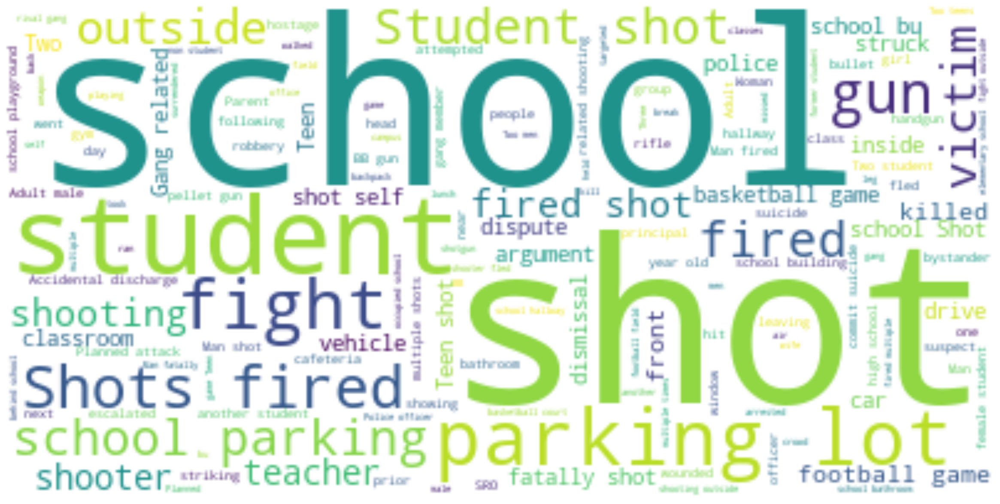

In [7]:
from wordcloud import WordCloud
def generate_wordcloud_from_column(dataframe, column_name):
    text = " ".join(summary for summary in dataframe[column_name])
    wordcloud = WordCloud(background_color="white").generate(text)
    plt.figure(figsize=(30,15))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


generate_wordcloud_from_column(df, 'Summary')

In [8]:
df['Narrative'] = df['Narrative'].fillna('No Narrative')

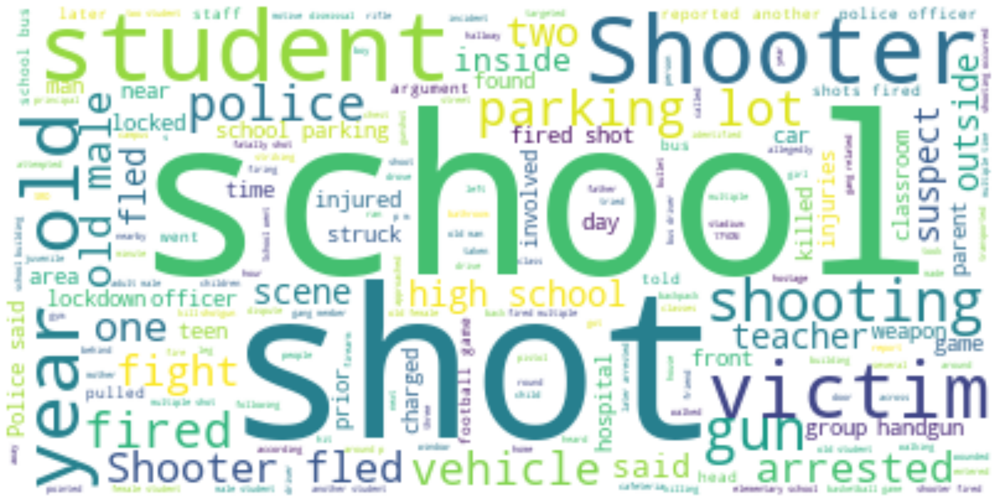

In [9]:
generate_wordcloud_from_column(df, 'Narrative')

#### Word Cloud for School

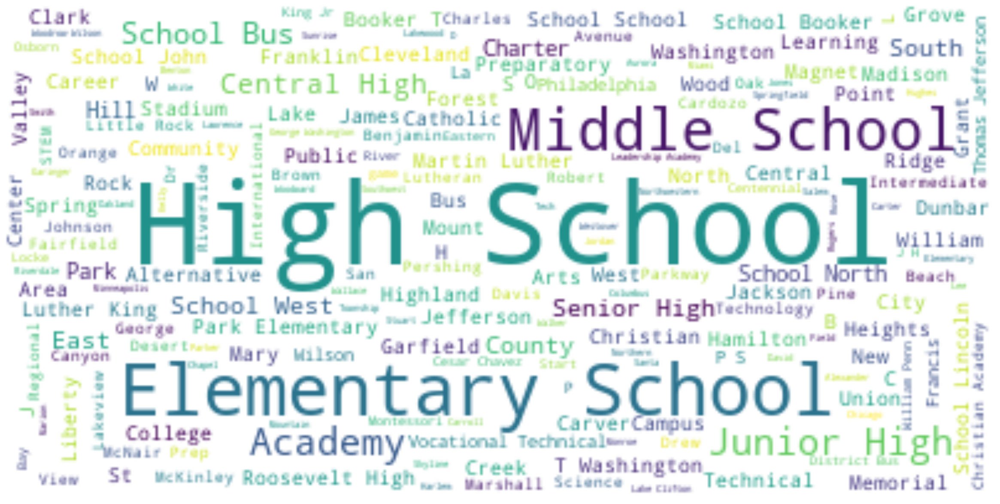

In [10]:
generate_wordcloud_from_column(df, 'School')

#### Word Cloud for City

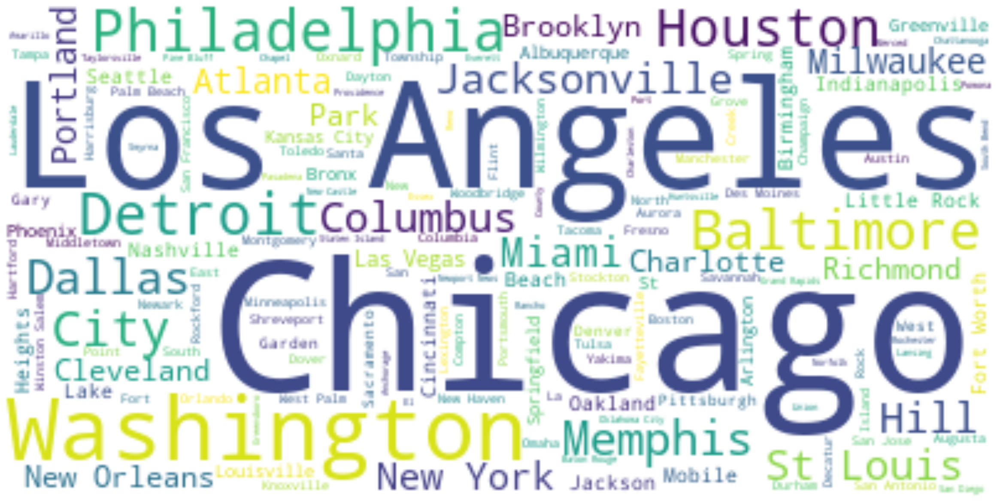

In [11]:
generate_wordcloud_from_column(df, 'City')

In [12]:
df['Summary_Length'] = df['Summary'].apply(len)
df['Narrative_Length'] = df['Narrative'].apply(len)

summary_stats = df['Summary_Length'].describe()
narrative_stats = df['Narrative_Length'].describe()

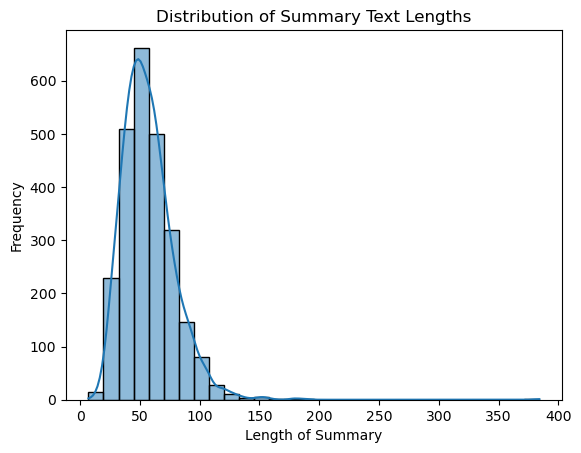

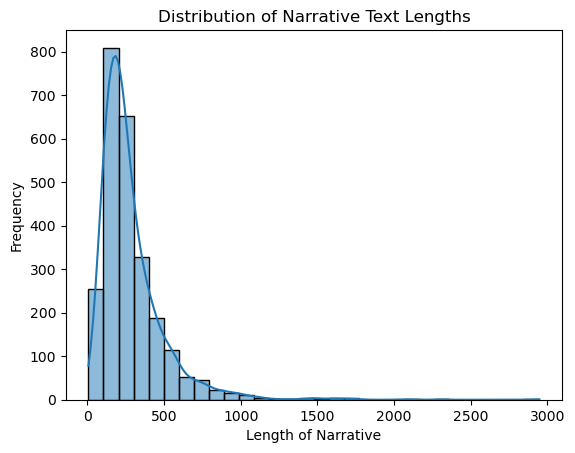

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Histogram of Summary Lengths
sns.histplot(df['Summary_Length'], bins=30, kde=True)
plt.title('Distribution of Summary Text Lengths')
plt.xlabel('Length of Summary')
plt.ylabel('Frequency')
plt.show()

# Histogram of Narrative Lengths
sns.histplot(df['Narrative_Length'], bins=30, kde=True)
plt.title('Distribution of Narrative Text Lengths')
plt.xlabel('Length of Narrative')
plt.ylabel('Frequency')
plt.show()

Removing Columns which are not required for Analysis

In [14]:
columns = ['Source', 'Location_Type', 'Summary', 'Narrative','Summary_Length','Narrative_Length','Unnamed: 0']
df = df.drop(columns = columns, axis=1)

In [15]:
df.shape

(2514, 49)

### Exploratory Data Analysis

In [16]:
df.head()

,Incident_ID,Month,Day,Year,Date,School,Victims_Killed,Victims_Wounded,Number_Victims,Shooter_Killed,Media_Attention,Reliability,Quarter,City,State,School_Level,Location,During_Classes,Time_Period,Duration_min,Situation,Involves_Students_Staff,Targets,Accomplice,Hostages,Barricade,Officer_Involved,Bullied,Domestic_Violence,Gang_Related,Active_Shooter_FBI,Shots_Fired,LAT,LNG,Shooter_Age,Shooter_Gender,Shooter_Race,Shooter_School_Affiliation,Shooter_Outcome,Shooter_Died,Shooter_Injury,No_of_Shooters,Victim_Injury,Victim_Gender,Victim_School_Affiliation,Victim_Age,Victim_Race,Weapon_Type,First_Shot
0,20230922KYMAL,9,22,2023,2023-09-22,Male High School,0,0,0,0,Local,4,Fall,Louisville,KY,High_School,Parking_Lot,No,School_Related_Event,1.0,Unknown,Yes,Mixed/Unclear,No,No,No,No,No,No,No,No,51-100,38.184302,-85.721643,Unknown,Unknown,Unknown,Other,Fled,No,No_Injury,Single_Shooter,No_Injury,Unknown,Unknown,Unknown,Unknown,Handgun,Evening
1,20230922TNWEM,9,22,2023,2023-09-22,Westwood Elementary School,0,1,1,0,Local,4,Fall,Manchester,TN,Primary_Education,Outside,No,Evening/Night,1.0,Unknown,No,Victims_Targeted,No,No,No,No,Unknown,No,Unknown,No,51-100,35.471951,-86.094245,Teen,Male,Unknown,Student/Former_Student,Fled,No,No_Injury,Single_Shooter,Wounded,Male,Student/Former_Student,Teen,Unknown,Handgun,Unknown
2,20230922TNSWS,9,22,2023,2023-09-22,Sweetwater High School,0,0,0,0,Local,4,Fall,Sweetwater,TN,High_School,Sports/Gym,No,School_Related_Event,1.0,Unknown,Yes,Unknown,Yes,No,No,No,Unknown,No,Unknown,No,1-5,35.597647,-84.469927,Teen,Male,Unknown,Other,Fled,No,No_Injury,Single_Shooter,No_Injury,Unknown,Unknown,Unknown,Unknown,Handgun,Evening
3,20230922WIMIM,9,22,2023,2023-09-22,Milwaukee Lutheran High School,0,0,0,0,Local,4,Fall,Milwaukee,WI,High_School,Sports/Gym,No,School_Related_Event,1.0,Unknown,Yes,Mixed/Unclear,No,No,No,No,Unknown,Unknown,Unknown,No,11-20,43.096217,-88.032836,Unknown,Unknown,Unknown,Other,Fled,No,No_Injury,Single_Shooter,No_Injury,Unknown,Unknown,Unknown,Unknown,Handgun,Evening
4,20230920ILVOC,9,20,2023,2023-09-20,Volta Elementary School,0,1,1,0,Local,4,Fall,Chicago,IL,Primary_Education,Outside,No,Evening/Night,1.0,Unknown,No,Unknown,No,No,No,No,No,No,Unknown,No,1-5,41.971271,-87.725529,Unknown,Unknown,Unknown,Other,Fled,No,No_Injury,Single_Shooter,Wounded,Male,No_School_Relation,Teen,Unknown,Unknown/Not_Specified,Evening


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2514 entries, 0 to 2513
Data columns (total 49 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Incident_ID                 2514 non-null   object 
 1   Month                       2514 non-null   int64  
 2   Day                         2514 non-null   int64  
 3   Year                        2514 non-null   int64  
 4   Date                        2514 non-null   object 
 5   School                      2514 non-null   object 
 6   Victims_Killed              2514 non-null   int64  
 7   Victims_Wounded             2514 non-null   int64  
 8   Number_Victims              2514 non-null   int64  
 9   Shooter_Killed              2514 non-null   int64  
 10  Media_Attention             2514 non-null   object 
 11  Reliability                 2514 non-null   int64  
 12  Quarter                     2514 non-null   object 
 13  City                        2514 

In [18]:
df.describe()

,Month,Day,Year,Victims_Killed,Victims_Wounded,Number_Victims,Shooter_Killed,Reliability,Duration_min,LAT,LNG
count,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000,2514.000000
mean,6.397375,15.795943,2007.925617,0.304296,0.838504,1.143198,0.094272,2.973747,5.284407,37.291633,-91.057189
std,3.612664,8.692847,16.005907,0.983795,2.204654,2.625478,0.296321,1.014473,45.638232,4.978259,15.148800
min,1.000000,1.000000,1966.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,17.752257,-161.770738
25%,3.000000,9.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,33.728978,-96.725673
50%,6.000000,15.000000,2016.000000,0.000000,0.000000,1.000000,0.000000,3.000000,1.000000,38.008021,-87.263672
75%,10.000000,23.000000,2021.000000,0.000000,1.000000,1.000000,0.000000,4.000000,1.000000,40.855736,-80.235690
max,12.000000,31.000000,2023.000000,26.000000,74.000000,74.000000,2.000000,5.000000,1260.000000,61.501143,-64.765778


In [19]:
df.describe(include='object')

,Incident_ID,Date,School,Media_Attention,Quarter,City,State,School_Level,Location,During_Classes,Time_Period,Situation,Involves_Students_Staff,Targets,Accomplice,Hostages,Barricade,Officer_Involved,Bullied,Domestic_Violence,Gang_Related,Active_Shooter_FBI,Shots_Fired,Shooter_Age,Shooter_Gender,Shooter_Race,Shooter_School_Affiliation,Shooter_Outcome,Shooter_Died,Shooter_Injury,No_of_Shooters,Victim_Injury,Victim_Gender,Victim_School_Affiliation,Victim_Age,Victim_Race,Weapon_Type,First_Shot
count,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514,2514
unique,2514,2024,2148,5,5,1060,52,4,7,3,8,7,3,4,3,3,3,3,3,3,3,3,8,5,5,7,8,9,4,6,3,5,4,8,5,6,6,5
top,20230922KYMAL,2023-01-10,Central High School,Unknown,Fall,Chicago,CA,High_School,Outside,Yes,During_Morning_Hours,Conflict_Related,Yes,Victims_Targeted,No,No,No,No,No,No,No,No,1-5,Teen,Male,Unknown,Student/Former_Student,Fled,No,No_Injury,Single_Shooter,Wounded,Male,Student/Former_Student,Teen,Unknown,Handgun,Afternoon
freq,1,5,20,1323,834,75,247,1561,665,1526,554,964,1331,1228,1626,2446,2452,2451,2059,2218,1588,1331,1080,1260,1909,1884,1114,1637,2266,2155,2304,993,1340,1073,1128,2269,1661,826


### Creating Our Target Variable

***0 - Incident Ocurred, but there are no Victims***

***1 - Incident Ocurred, there are Victims (Either killed our wounded)***

In [20]:
df['Has_Victims'] = df['Number_Victims'].apply(lambda x: 1 if x > 0 else 0)

In [21]:
target_distribution = df['Has_Victims'].value_counts(normalize=True)

In [22]:
target_distribution

1    0.639618
0    0.360382
Name: Has_Victims, dtype: float64

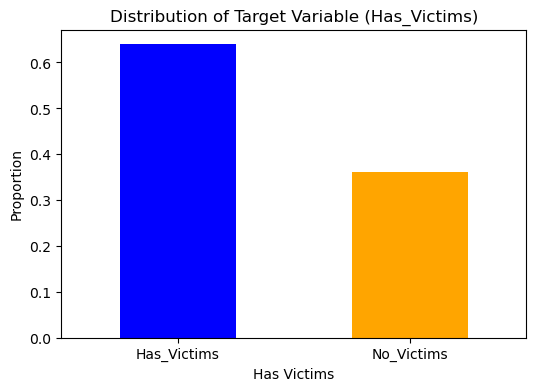

In [23]:
plt.figure(figsize=(6, 4))
target_distribution.plot(kind='bar', color=['blue', 'orange'])
plt.title('Distribution of Target Variable (Has_Victims)')
plt.xlabel('Has Victims')
plt.ylabel('Proportion')
plt.xticks(ticks=[1, 0], labels=['No_Victims', 'Has_Victims'], rotation=0)  # Corrected labels
plt.show()

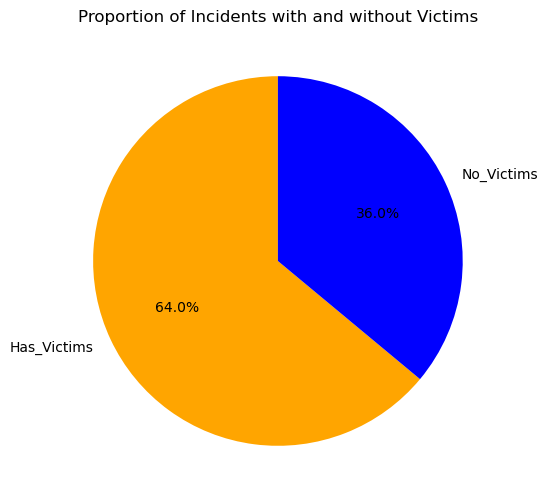

In [24]:
plt.figure(figsize=(6, 6))
target_distribution.plot(kind='pie', labels=['Has_Victims', 'No_Victims'], autopct='%1.1f%%', startangle=90, colors=['orange', 'blue'])
plt.title('Proportion of Incidents with and without Victims')
plt.ylabel('')
plt.show()

### 1. Incident Details

a. Yearly Trend

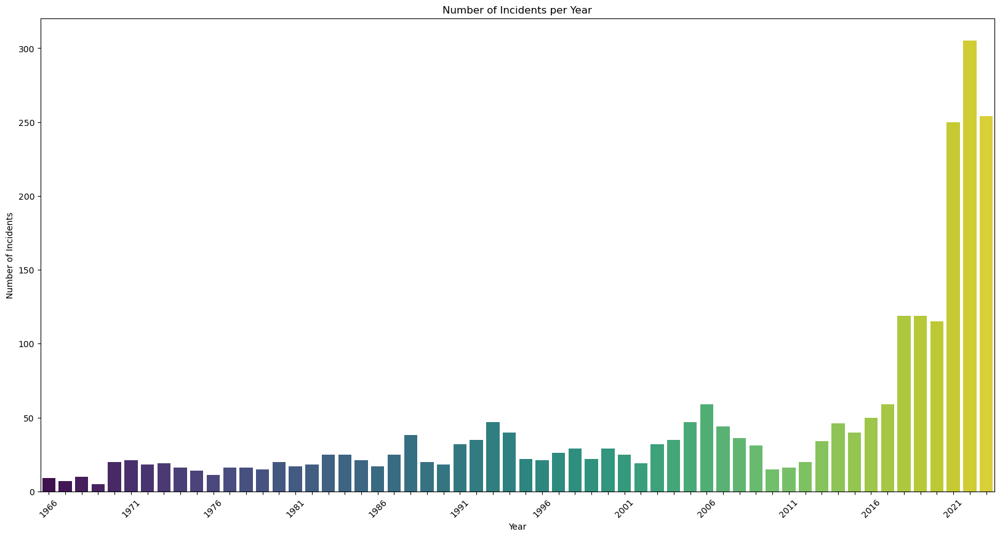

In [25]:
# Reducing clutter in the x-axis by displaying only every nth label
plt.figure(figsize=(20, 10))
sns.countplot(x='Year', data=df, palette="viridis")
plt.title('Number of Incidents per Year')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')

# Displaying only every 5th year label for clarity
for i, label in enumerate(plt.gca().get_xticklabels()):
    if i % 5 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)

plt.xticks(rotation=45)
plt.show()

b. Incidents with and without victims over the year

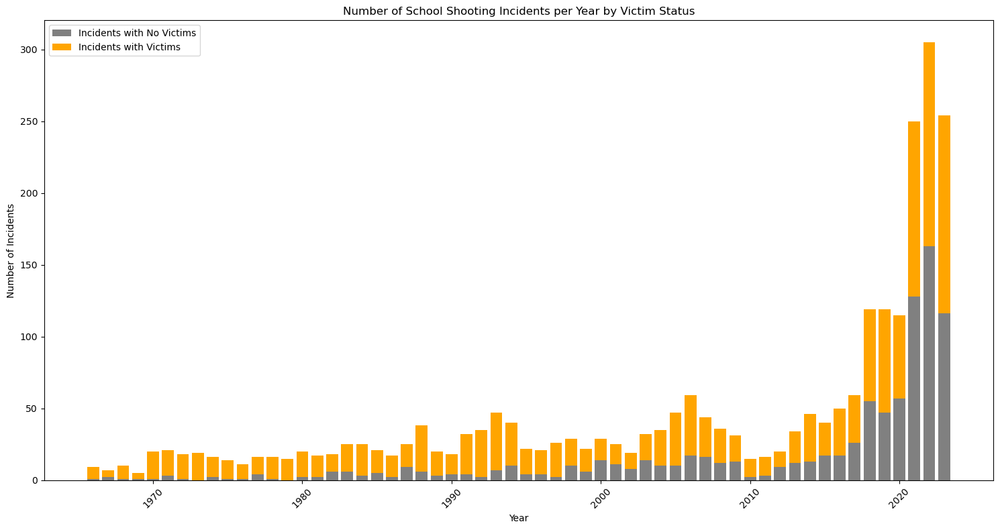

In [26]:
# Grouping the data by year and 'Has_Victims', then counting the number of incidents
incidents_per_year = df.groupby(['Year', 'Has_Victims']).size().unstack(fill_value=0)

# Creating the stacked bar chart
plt.figure(figsize=(15, 8))
plt.bar(incidents_per_year.index, incidents_per_year[0], label='Incidents with No Victims', color='gray')
plt.bar(incidents_per_year.index, incidents_per_year[1], bottom=incidents_per_year[0], label='Incidents with Victims', color='orange')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.title('Number of School Shooting Incidents per Year by Victim Status')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

c. Total No of Victims killed and wounded over time

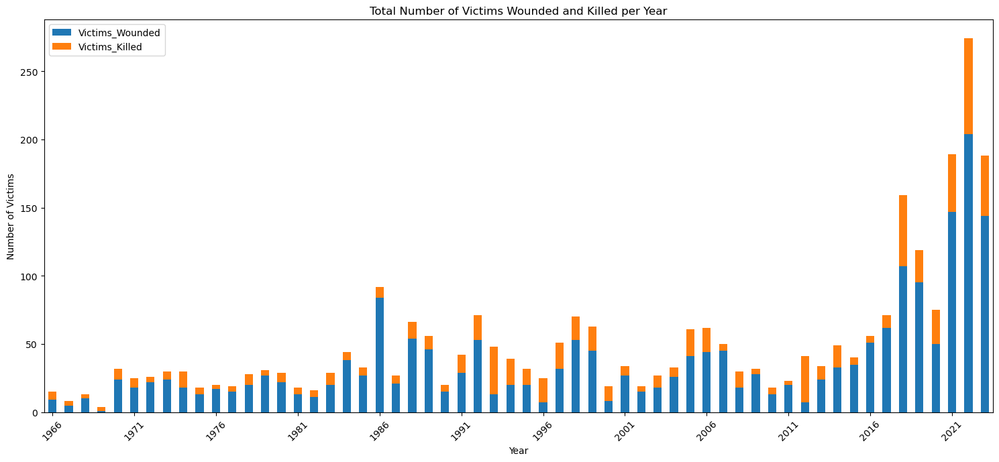

In [27]:
# Group the data by 'Year' and sum the 'Victims_Wounded' and 'Victims_Killed' for each year
grouped_data = df.groupby('Year')[['Victims_Wounded', 'Victims_Killed']].sum()

# Plotting the stacked bar chart
ax = grouped_data.plot(kind='bar', stacked=True, figsize=(15, 7))
plt.title('Total Number of Victims Wounded and Killed per Year')
plt.xlabel('Year')
plt.ylabel('Number of Victims')
ax.set_xticks(range(0, len(grouped_data.index), 5))
ax.set_xticklabels(grouped_data.index[::5])
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Converting Date into DateTime format

In [28]:
df['Date'] = pd.to_datetime(df['Date'])
df['Weekday'] = df['Date'].dt.day_name()
df['Month'] = df['Date'].dt.month_name()

Montly and Daywise Distribution

<Figure size 1000x500 with 0 Axes>

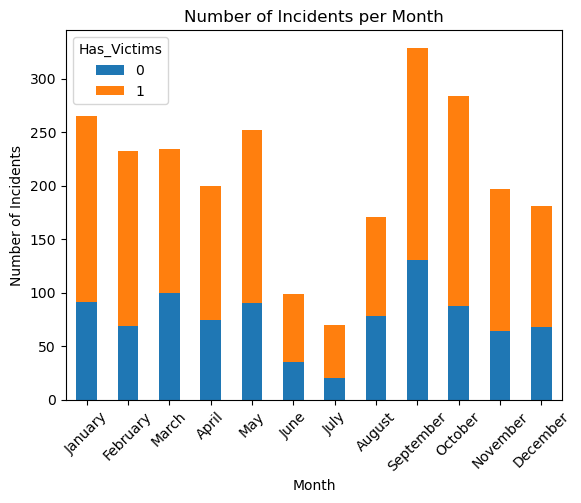

In [29]:
# Sort the months and weekdays in chronological order
months_order = ['January', 'February', 'March', 'April', 'May', 'June',
                'July', 'August', 'September', 'October', 'November', 'December']
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

df['Month'] = pd.Categorical(df['Month'], categories=months_order, ordered=True)
df['Weekday'] = pd.Categorical(df['Weekday'], categories=days_order, ordered=True)


monthly_counts = df.groupby(['Month', 'Has_Victims']).size().unstack().reindex(months_order)


plt.figure(figsize=(10, 5))
monthly_counts.plot(kind='bar', stacked=True)
plt.title('Number of Incidents per Month')
plt.xlabel('Month')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.show()

<Figure size 1000x500 with 0 Axes>

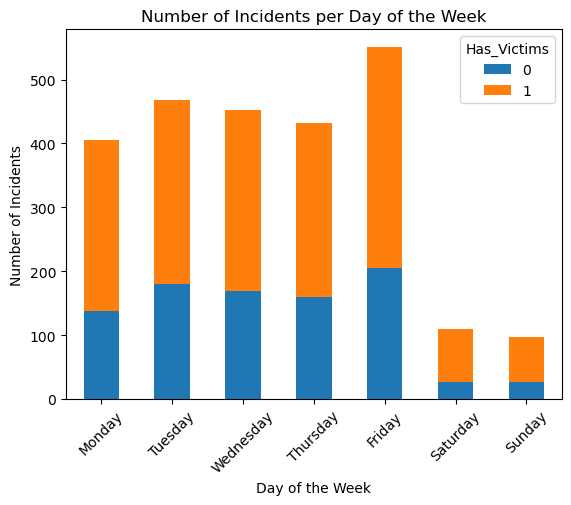

In [30]:

# Preparing data for the Daywise distribution plot
daywise_counts = df.groupby(['Weekday', 'Has_Victims']).size().unstack().reindex(days_order)

# Plot for Daywise distribution
plt.figure(figsize=(10, 5))
daywise_counts.plot(kind='bar', stacked=True)
plt.title('Number of Incidents per Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.show()

Relationship Between No of Incidents & Total Number of Victims

In [351]:
yearly_data = df.groupby('Year').agg(Total_Incidents=('Incident_ID', 'count'),
                                     Total_Victims=('Number_Victims', 'sum'))

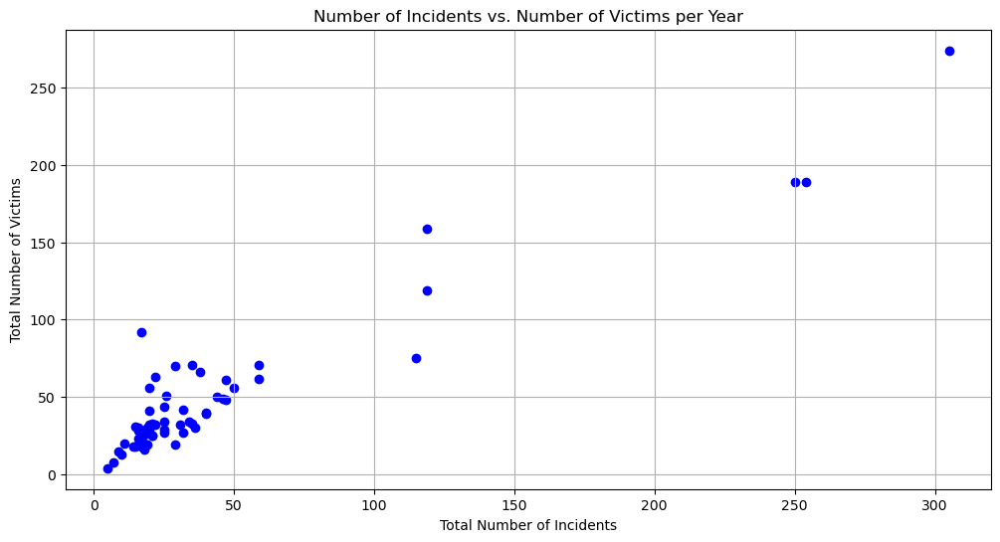

In [352]:
plt.figure(figsize=(12, 6))
plt.scatter(yearly_data['Total_Incidents'], yearly_data['Total_Victims'], color='blue')
plt.title('Number of Incidents vs. Number of Victims per Year')
plt.xlabel('Total Number of Incidents')
plt.ylabel('Total Number of Victims')
plt.grid(True)
plt.show()

Top Schools where they were highest victims

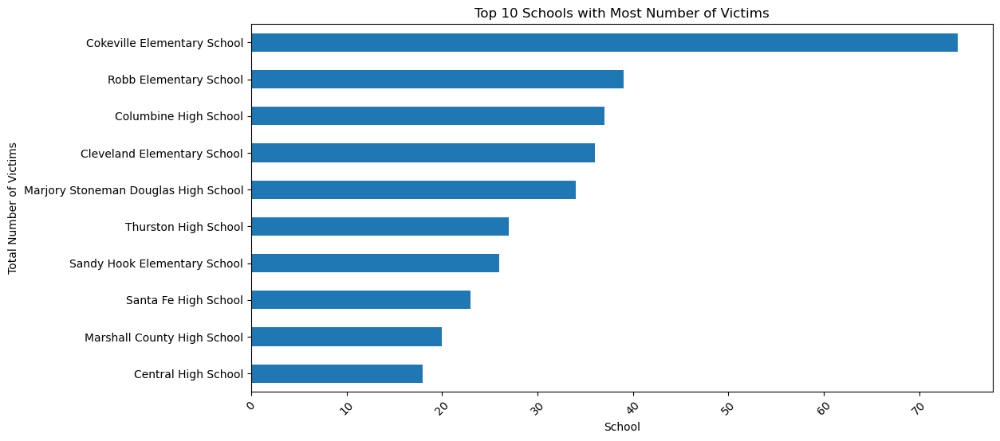

In [353]:
# Aggregate the total number of victims by school and get the top 5 schools
top_schools_victims = df.groupby('School')['Number_Victims'].sum().nlargest(10).sort_values()

plt.figure(figsize=(12, 6))
top_schools_victims.plot(kind='barh')
plt.title('Top 10 Schools with Most Number of Victims')
plt.xlabel('School')
plt.ylabel('Total Number of Victims')
plt.xticks(rotation=45)
plt.show()

Top 5 States with Most Number of Victims

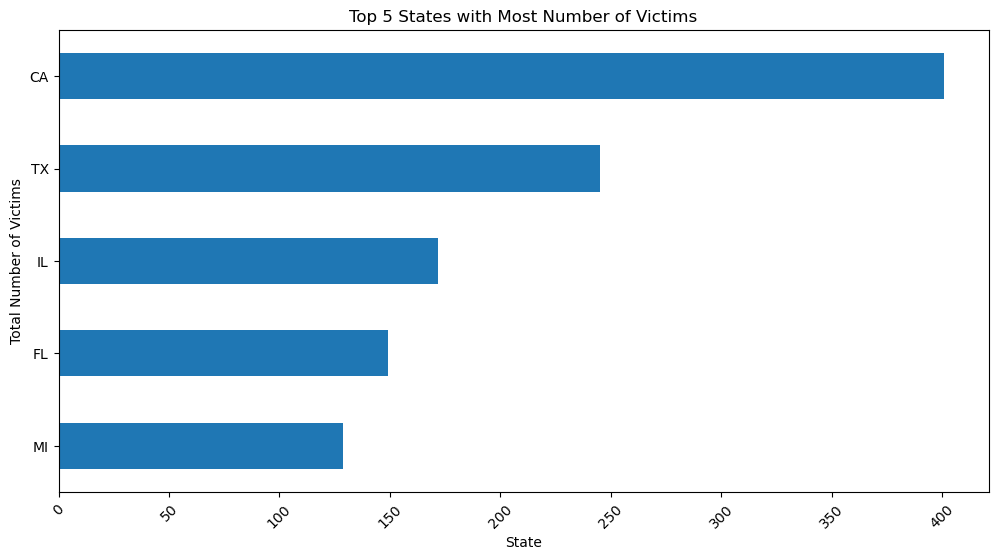

In [143]:
top_states_victims = df.groupby('State')['Number_Victims'].sum().nlargest(5).sort_values()

# Plot
plt.figure(figsize=(12, 6))
top_states_victims.plot(kind='barh')
plt.title('Top 5 States with Most Number of Victims')
plt.xlabel('State')
plt.ylabel('Total Number of Victims')
plt.xticks(rotation=45)
plt.show()

In [144]:
situation_stats = df.groupby('Situation').agg(
    Number_Incidents=('Incident_ID', 'count'),
    Total_Victims_Killed=('Number_Victims', 'sum')
).reset_index()

In [145]:
situation_stats.sort_values(by='Number_Incidents', ascending=False)

,Situation,Number_Incidents,Total_Victims_Killed
1,Conflict_Related,964,1209
2,Criminal_Activity,422,345
6,Unknown,291,225
5,Personal_Crisis,286,179
0,Accidental,241,148
4,Other,238,649
3,Law_Enforcement,72,119


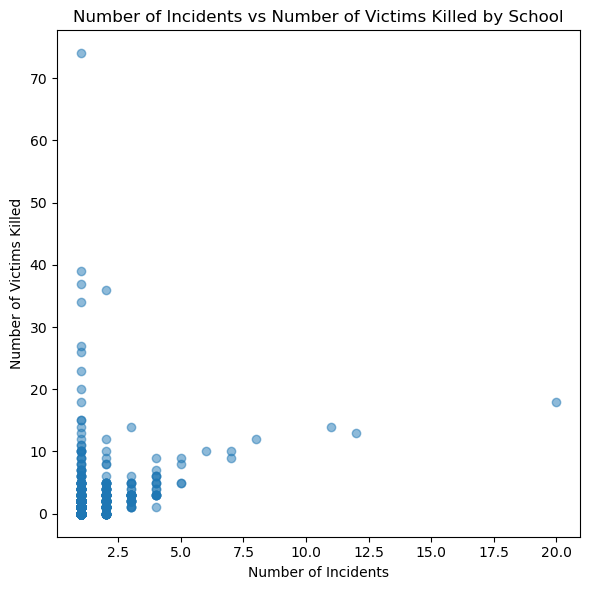

In [146]:
school_stats = df.groupby('School').agg(
    Number_Incidents=('Incident_ID', 'count'),
    Total_Victims_Killed=('Number_Victims', 'sum')
).reset_index()


plt.figure(figsize=(6, 6))
plt.scatter(school_stats['Number_Incidents'], school_stats['Total_Victims_Killed'], alpha=0.5)
plt.title('Number of Incidents vs Number of Victims Killed by School')
plt.xlabel('Number of Incidents')
plt.ylabel('Number of Victims Killed')
plt.tight_layout()
plt.show()

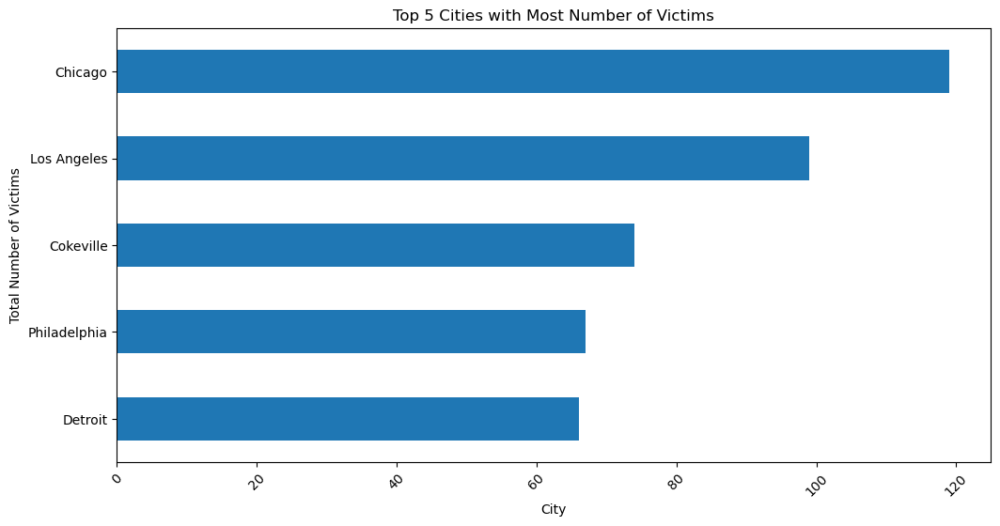

In [147]:
top_city_victims = df.groupby('City')['Number_Victims'].sum().nlargest(5).sort_values()

# Plot
plt.figure(figsize=(12, 6))
top_city_victims.plot(kind='barh')
plt.title('Top 5 Cities with Most Number of Victims')
plt.xlabel('City')
plt.ylabel('Total Number of Victims')
plt.xticks(rotation=45)
plt.show()

Time of Day

<Figure size 1000x500 with 0 Axes>

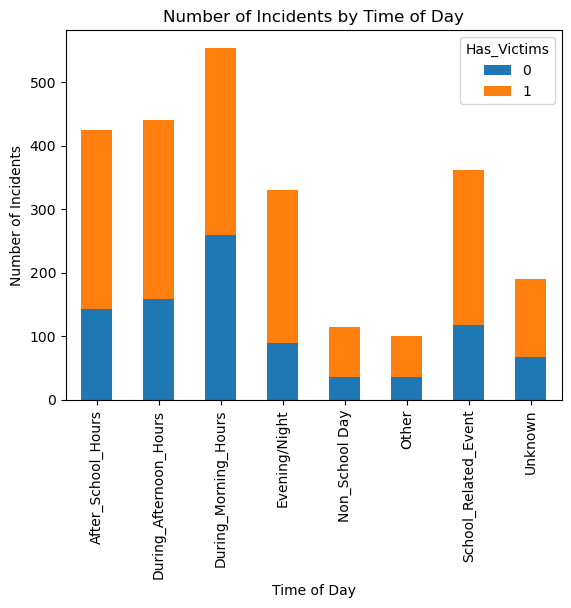

In [148]:
time_period_counts = df.groupby(['Time_Period', 'Has_Victims']).size().unstack()

# Plot
plt.figure(figsize=(10, 5))
time_period_counts.plot(kind='bar', stacked=True)
plt.title('Number of Incidents by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Incidents')
plt.show()

Duration of Incident

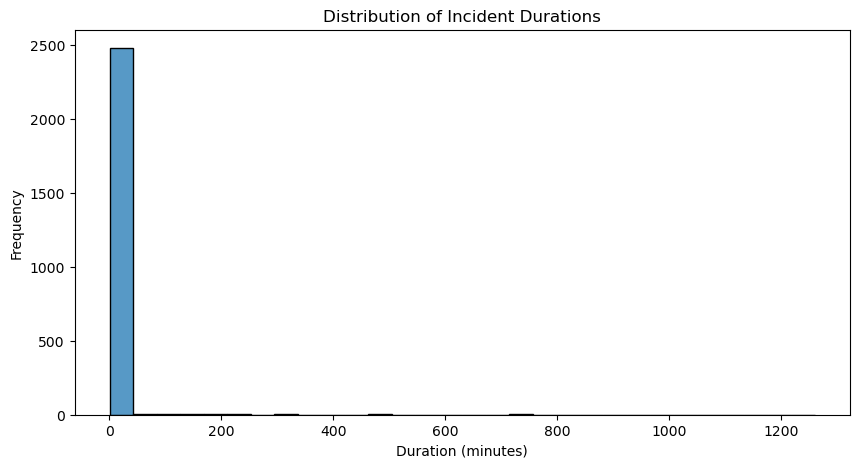

In [149]:
plt.figure(figsize=(10, 5))
sns.histplot(df['Duration_min'], bins=30, kde=False)
plt.title('Distribution of Incident Durations')
plt.xlabel('Duration (minutes)')
plt.ylabel('Frequency')
plt.show()

State Level Analysis

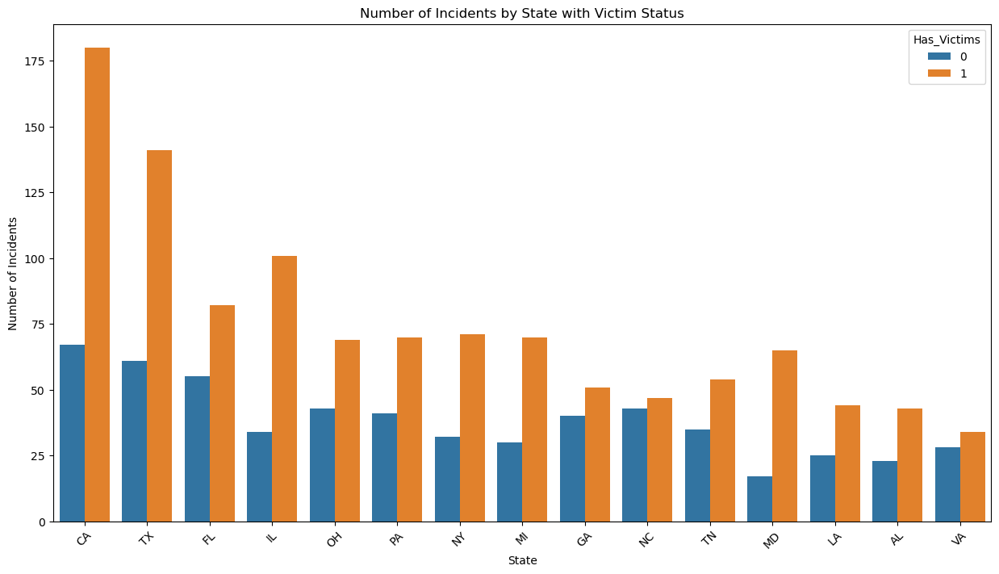

In [150]:
plt.figure(figsize=(15, 8))
sns.countplot(data=df, x='State', hue='Has_Victims', order=df['State'].value_counts().index[:15])
plt.title('Number of Incidents by State with Victim Status')
plt.xlabel('State')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.show()

City Level Analysis

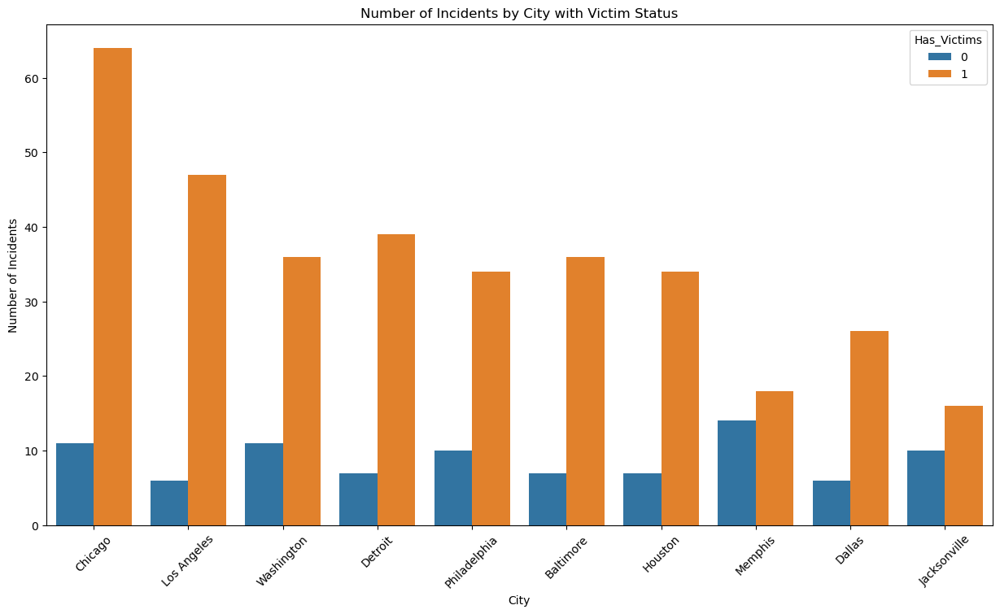

In [ ]:
import seaborn as sns

plt.figure(figsize=(15, 8))
sns.countplot(data=df, x='City', hue='Has_Victims', order=df['City'].value_counts().index[:10])
plt.title('Number of Incidents by City with Victim Status')
plt.xlabel('City')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45)
plt.show()

School Level Analysis

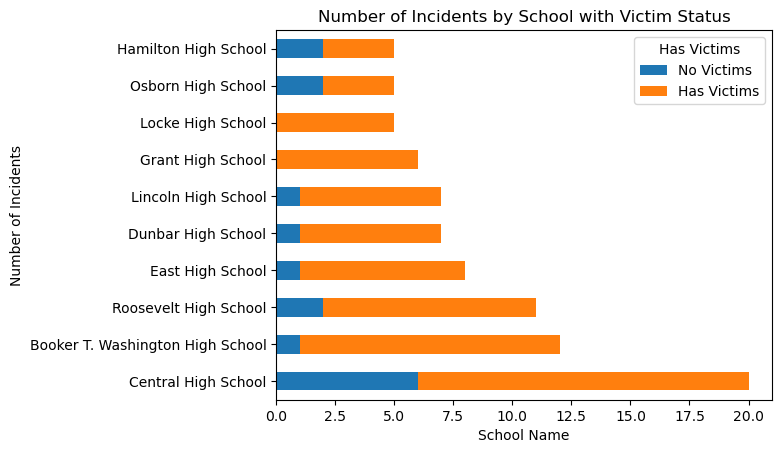

In [ ]:
# Group the data by school name and 'Has_Victims', then count the number of incidents
school_victim_counts = df.groupby(['School', 'Has_Victims']).size().unstack(fill_value=0)

# Sort the schools by the total number of incidents and select the top N
top_schools = school_victim_counts.sum(axis=1).sort_values(ascending=False).head(10)

# Filter the data to include only the top schools
top_schools_data = school_victim_counts.loc[top_schools.index]

# Plot
top_schools_data.plot(kind='barh', stacked=True)
plt.title('Number of Incidents by School with Victim Status')
plt.xlabel('School Name')
plt.ylabel('Number of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

School Level Analysis

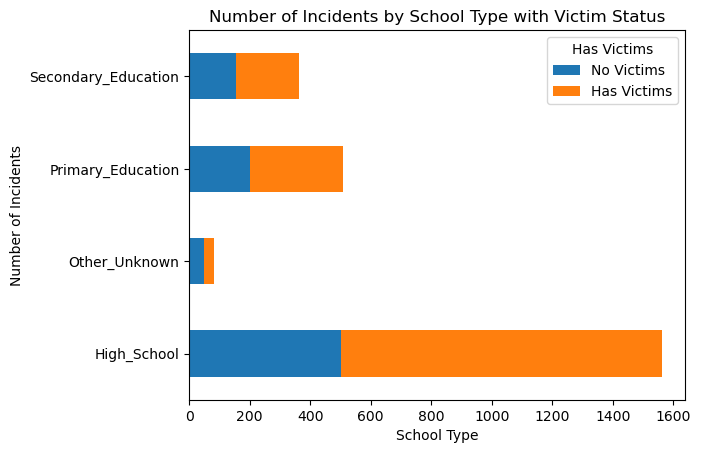

In [ ]:
# Group the data by school type and 'Has_Victims', then count the number of incidents
school_type_victim_counts = df.groupby(['School_Level', 'Has_Victims']).size().unstack(fill_value=0)

# Plot
school_type_victim_counts.plot(kind='barh', stacked=True)
plt.title('Number of Incidents by School Type with Victim Status')
plt.xlabel('School Type')
plt.ylabel('Number of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

Perpetrator Details

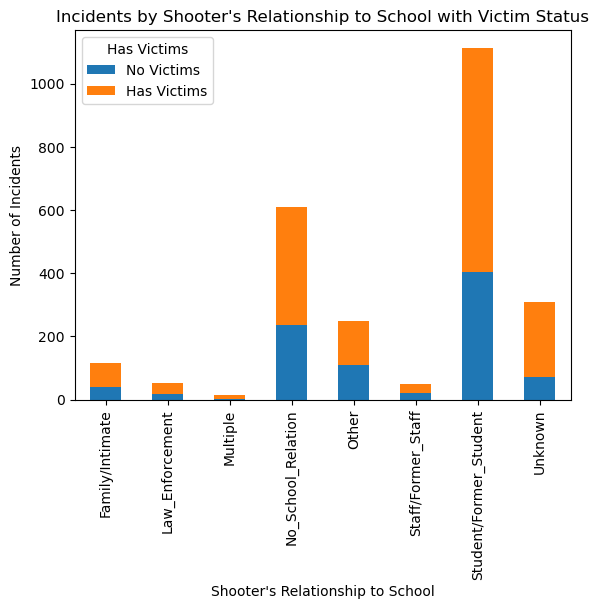

In [ ]:
# Group the data by the shooter's relationship to the school and 'Has_Victims'
relationship_counts = df.groupby(['Shooter_School_Affiliation', 'Has_Victims']).size().unstack(fill_value=0)

# Plot
relationship_counts.plot(kind='bar', stacked=True)
plt.title('Incidents by Shooter\'s Relationship to School with Victim Status')
plt.xlabel('Shooter\'s Relationship to School')
plt.ylabel('Number of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

Distribution of Age for shooter

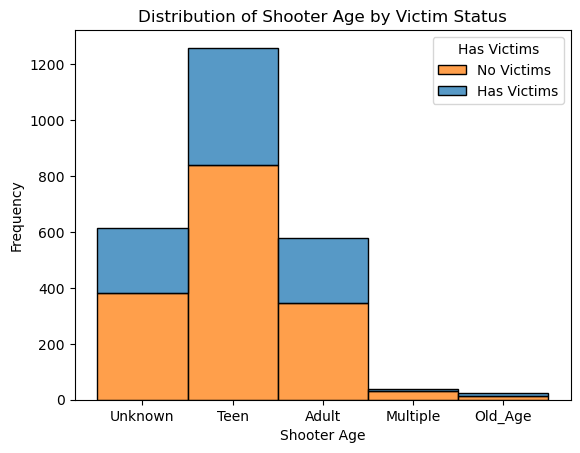

In [ ]:
sns.histplot(data=df, x='Shooter_Age', hue='Has_Victims', multiple='stack', bins=20)
plt.title('Distribution of Shooter Age by Victim Status')
plt.xlabel('Shooter Age')
plt.ylabel('Frequency')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

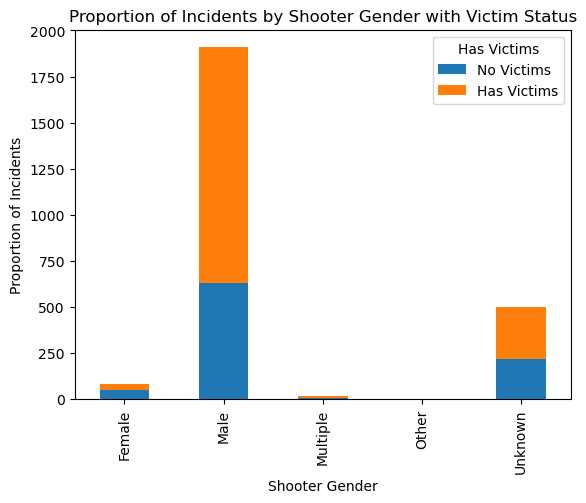

In [ ]:
gender_proportions = df.groupby('Shooter_Gender')['Has_Victims'].value_counts().unstack(fill_value=0)
gender_proportions.plot(kind='bar', stacked=True)
plt.title('Proportion of Incidents by Shooter Gender with Victim Status')
plt.xlabel('Shooter Gender')
plt.ylabel('Proportion of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

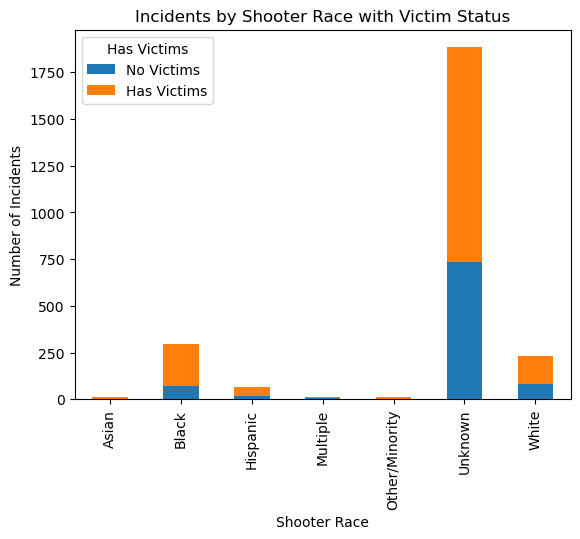

In [ ]:
race_counts = df.groupby(['Shooter_Race', 'Has_Victims']).size().unstack(fill_value=0)
race_counts.plot(kind='bar', stacked=True)
plt.title('Incidents by Shooter Race with Victim Status')
plt.xlabel('Shooter Race')
plt.ylabel('Number of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

Weapon Type Analysis

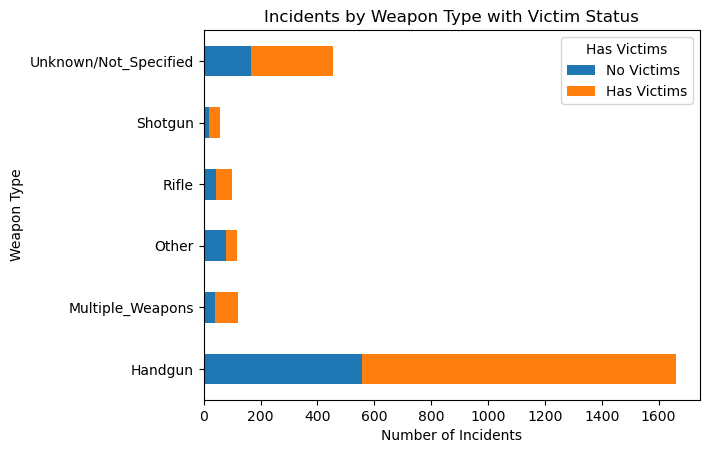

In [ ]:
# Group the data by weapon type and 'Has_Victims'
weapon_type_counts = df.groupby(['Weapon_Type', 'Has_Victims']).size().unstack(fill_value=0)

# Plot
weapon_type_counts.plot(kind='barh', stacked=True)
plt.title('Incidents by Weapon Type with Victim Status')
plt.xlabel('Number of Incidents')
plt.ylabel('Weapon Type')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

No of Shooters

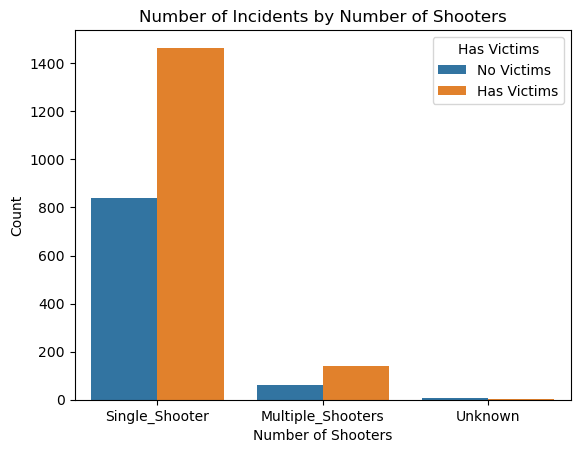

In [ ]:
sns.countplot(x='No_of_Shooters', hue='Has_Victims', data=df)
plt.title('Number of Incidents by Number of Shooters')
plt.xlabel('Number of Shooters')
plt.ylabel('Count')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.show()

Situation

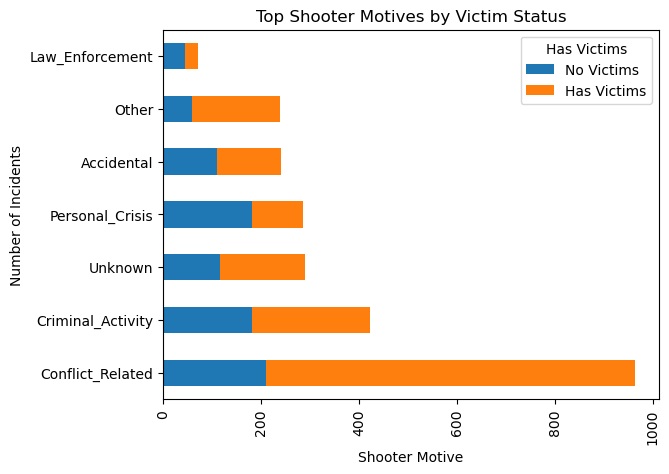

In [ ]:

motive_counts = df.groupby(['Situation', 'Has_Victims']).size().unstack(fill_value=0)


top_motive_counts = motive_counts.sum(axis=1).sort_values(ascending=False)
top_motive_counts_data = motive_counts.loc[top_motive_counts.index]

top_motive_counts_data.plot(kind='barh', stacked=True)
plt.title('Top Shooter Motives by Victim Status')
plt.xlabel('Shooter Motive')
plt.ylabel('Number of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.xticks(rotation=90)
plt.show()

School Location-wise incidents

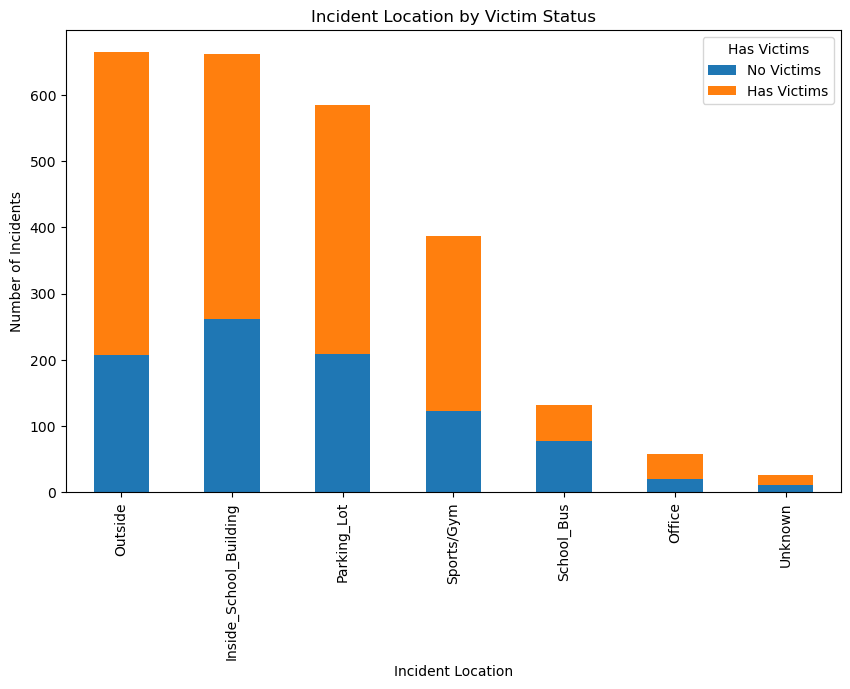

In [ ]:
import matplotlib.pyplot as plt

location_counts = df.groupby(['Location', 'Has_Victims']).size().unstack(fill_value=0)

location_counts['Total'] = location_counts.sum(axis=1)
sorted_location_counts = location_counts.sort_values('Total', ascending=False).drop('Total', axis=1)

# Create a stacked bar plot for the top N shooter motives
top_location_counts = sorted_location_counts.head(20)
top_location_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Incident Location by Victim Status')
plt.xlabel('Incident Location')
plt.ylabel('Number of Incidents')
plt.legend(title='Has Victims', labels=['No Victims', 'Has Victims'])
plt.xticks(rotation=90)
plt.show()

Victim Analysis

In [253]:
df.columns

Index(['Incident_ID', 'Month', 'Day', 'Year', 'Date', 'School',
       'Victims_Killed', 'Victims_Wounded', 'Number_Victims', 'Shooter_Killed',
       'Media_Attention', 'Reliability', 'Quarter', 'City', 'State',
       'School_Level', 'Location', 'During_Classes', 'Time_Period',
       'Duration_min', 'Situation', 'Involves_Students_Staff', 'Targets',
       'Accomplice', 'Hostages', 'Barricade', 'Officer_Involved', 'Bullied',
       'Domestic_Violence', 'Gang_Related', 'Active_Shooter_FBI',
       'Shots_Fired', 'LAT', 'LNG', 'Shooter_Age', 'Shooter_Gender',
       'Shooter_Race', 'Shooter_School_Affiliation', 'Shooter_Outcome',
       'Shooter_Died', 'Shooter_Injury', 'No_of_Shooters', 'Victim_Injury',
       'Victim_Gender', 'Victim_School_Affiliation', 'Victim_Age',
       'Victim_Race', 'Weapon_Type', 'First_Shot', 'Has_Victims', 'Weekday'],
      dtype='object')

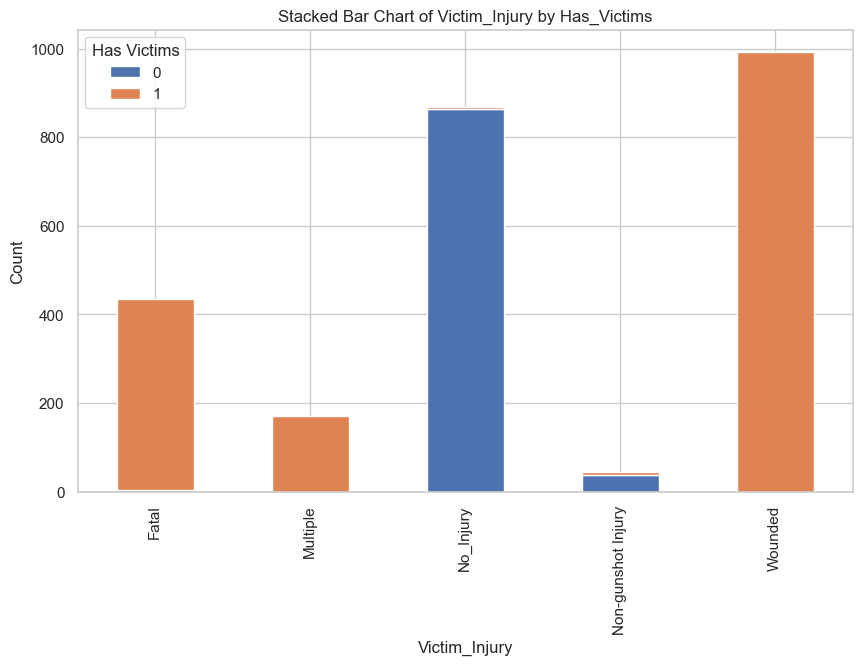

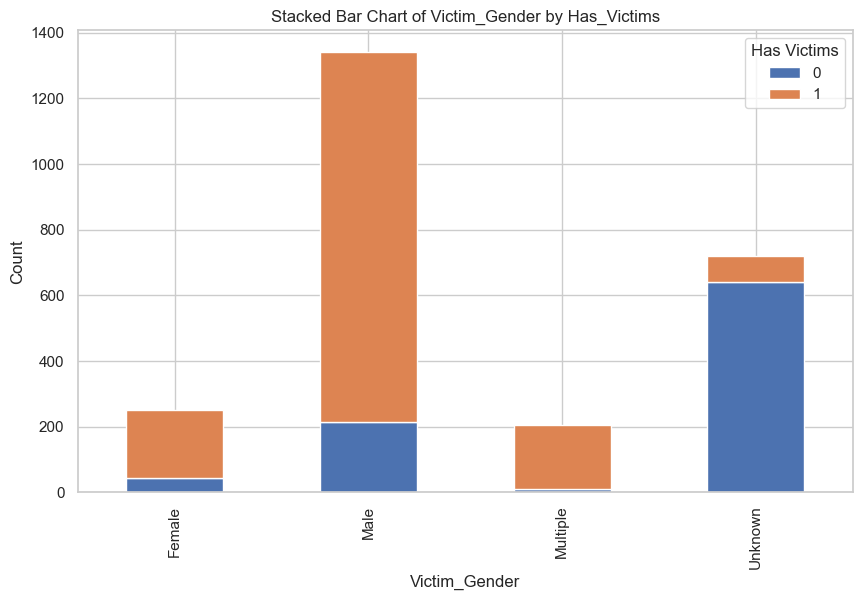

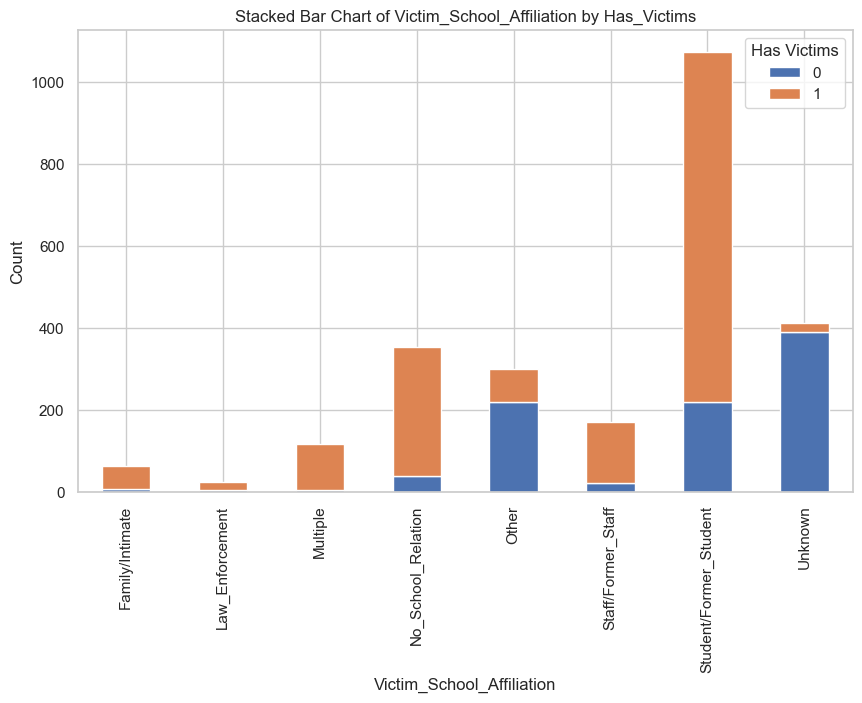

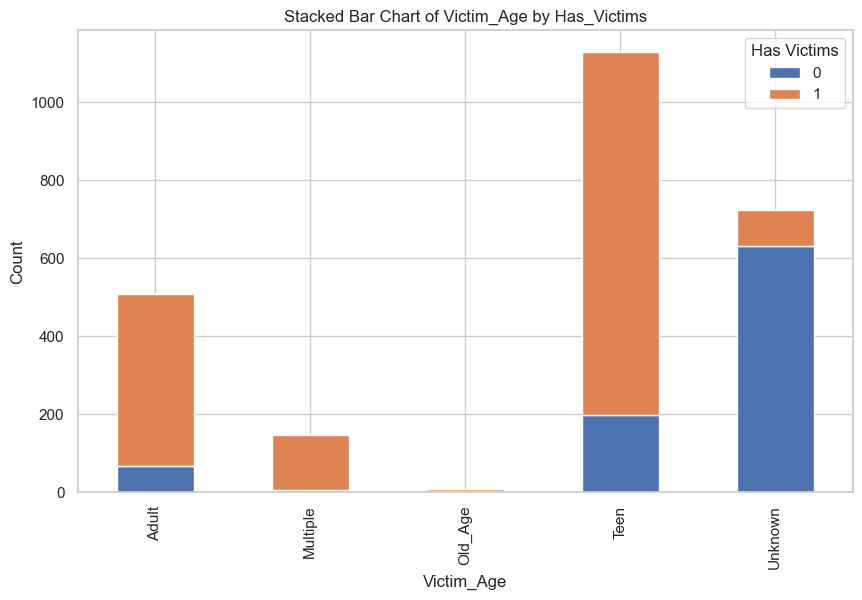

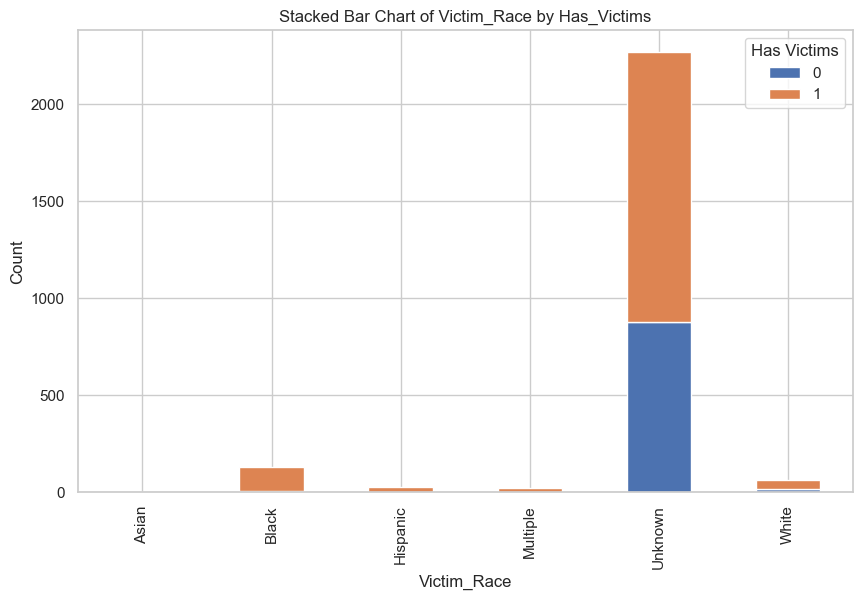

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# List of columns to plot
columns_to_plot = ["Victim_Injury", "Victim_Gender", "Victim_School_Affiliation", "Victim_Age", "Victim_Race"]

# Function to plot stacked bar chart
def plot_stacked_bar(column, data):
    # Create a crosstab
    crosstab = pd.crosstab(data[column], data['Has_Victims'])

    # Create a stacked bar chart
    crosstab.plot(kind='bar', stacked=True, figsize=(10, 6))

    # Add titles and labels
    plt.title(f'Stacked Bar Chart of {column} by Has_Victims')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend(title='Has Victims')

    # Show the plot
    plt.show()

# Generate plots for each column
for column in columns_to_plot:
    plot_stacked_bar(column, df)

#### Feature Selection

In [43]:
df = df.drop(['Incident_ID','Date','Victims_Killed','Victims_Wounded','Number_Victims'], axis=1)

In [44]:
import pandas as pd
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
unique_counts = df[categorical_columns].nunique()

Index(['Month', 'School', 'Media_Attention', 'Quarter', 'City', 'State',
       'School_Level', 'Location', 'During_Classes', 'Time_Period',
       'Situation', 'Involves_Students_Staff', 'Targets', 'Accomplice',
       'Hostages', 'Barricade', 'Officer_Involved', 'Bullied',
       'Domestic_Violence', 'Gang_Related', 'Active_Shooter_FBI',
       'Shots_Fired', 'Shooter_Age', 'Shooter_Gender', 'Shooter_Race',
       'Shooter_School_Affiliation', 'Shooter_Outcome', 'Shooter_Died',
       'Shooter_Injury', 'No_of_Shooters', 'Victim_Injury', 'Victim_Gender',
       'Victim_School_Affiliation', 'Victim_Age', 'Victim_Race', 'Weapon_Type',
       'First_Shot', 'Weekday'],
      dtype='object')


In [45]:
import pandas as pd
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print(numerical_columns)

Index(['Day', 'Year', 'Shooter_Killed', 'Reliability', 'Duration_min', 'LAT',
       'LNG', 'Has_Victims'],
      dtype='object')


In [46]:
df1 = df.copy()

#### Splitting the data, encoding, and passing through Chisquared Test

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from category_encoders import CountEncoder

X = df1.drop('Has_Victims', axis=1)
y = df1['Has_Victims']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

# Store Encoders
label_encoders = {}
count_encoders = {}

for col in categorical_columns:
    if unique_counts[col] > 3:
        # Count encoding
        count_encoders[col] = CountEncoder()
        X_train[col] = count_encoders[col].fit_transform(X_train[col])
        X_test[col] = count_encoders[col].transform(X_test[col])
    else:
        # Label encoding
        label_encoders[col] = LabelEncoder()
        X_train[col] = label_encoders[col].fit_transform(X_train[col])
        X_test[col] = X_test[col].map(lambda s: 'Unknown' if s not in label_encoders[col].classes_ else s)
        label_encoders[col].classes_ = np.append(label_encoders[col].classes_, 'Unknown')
        X_test[col] = label_encoders[col].transform(X_test[col])

In [48]:
from sklearn.feature_selection import SelectKBest, chi2
import pandas as pd

# Apply SelectKBest
selector = SelectKBest(score_func=chi2, k='all')
selector.fit(X_train[categorical_columns], y_train)

# Columns selected by SelectKBest
cols = selector.get_support(indices=True)

# DataFrame with selected features from X_train
selected_features_df = X_train[categorical_columns].iloc[:, cols]

# Extract p-values and scores
p_values = selector.pvalues_
chi2_scores = selector.scores_

# Compile results
results = []
for i, col in enumerate(selected_features_df.columns):
    results.append({'Feature': col, 'Score': chi2_scores[i], 'P-value': p_values[i].round(3)})

# DataFrame from the results and sort it
chi_squared_results_df = pd.DataFrame(results)
chi_squared_results_df = chi_squared_results_df.sort_values(by='Score', ascending=False)

chi_squared_results_df

,Feature,Score,P-value
26,Shooter_Outcome,26471.867722,0.000
28,Shooter_Injury,22875.039249,0.000
10,Situation,15015.399820,0.000
32,Victim_School_Affiliation,10791.958325,0.000
31,Victim_Gender,10622.216919,0.000
34,Victim_Race,9085.654967,0.000
27,Shooter_Died,8947.094126,0.000
23,Shooter_Gender,7139.830072,0.000
24,Shooter_Race,6490.018424,0.000
6,School_Level,5093.160355,0.000


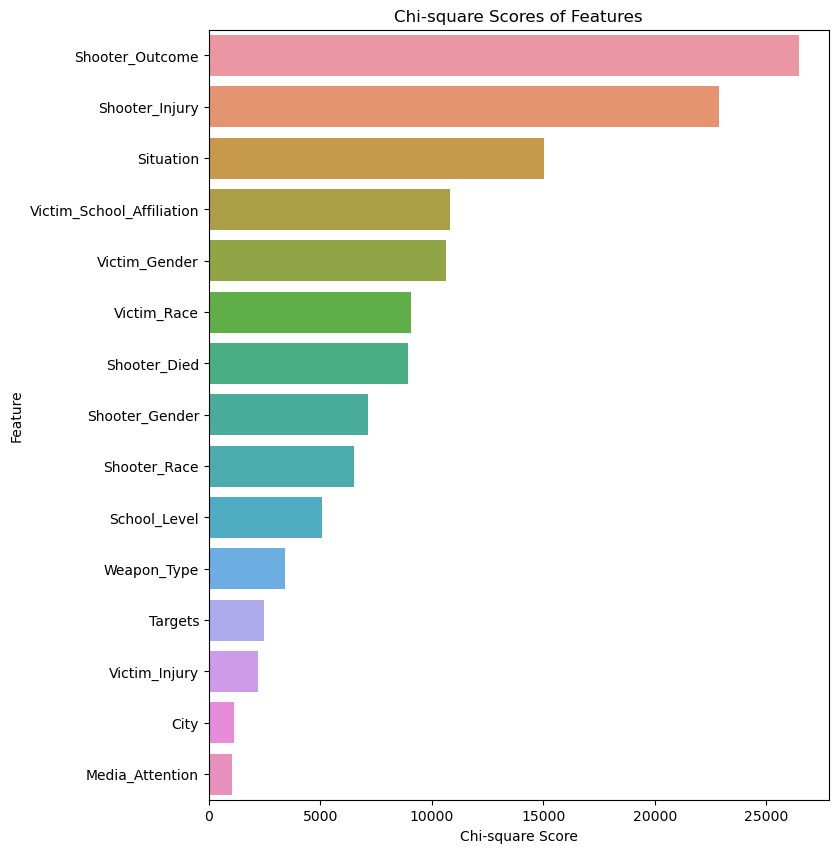

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns


chi_squared_results_df = chi_squared_results_df.sort_values(by='Score', ascending=False)

# Creating the bar plot
plt.figure(figsize=(8, 10))
sns.barplot(x='Score', y='Feature', data=chi_squared_results_df[:15])

plt.title('Chi-square Scores of Features')
plt.xlabel('Chi-square Score')
plt.ylabel('Feature')
plt.show()

##### Getting the top 15 features from chisquared

In [50]:
chi_squared_results_df['Feature'][:15]

26              Shooter_Outcome
28               Shooter_Injury
10                    Situation
32    Victim_School_Affiliation
31                Victim_Gender
34                  Victim_Race
27                 Shooter_Died
23               Shooter_Gender
24                 Shooter_Race
6                  School_Level
35                  Weapon_Type
12                      Targets
30                Victim_Injury
4                          City
2               Media_Attention
Name: Feature, dtype: object

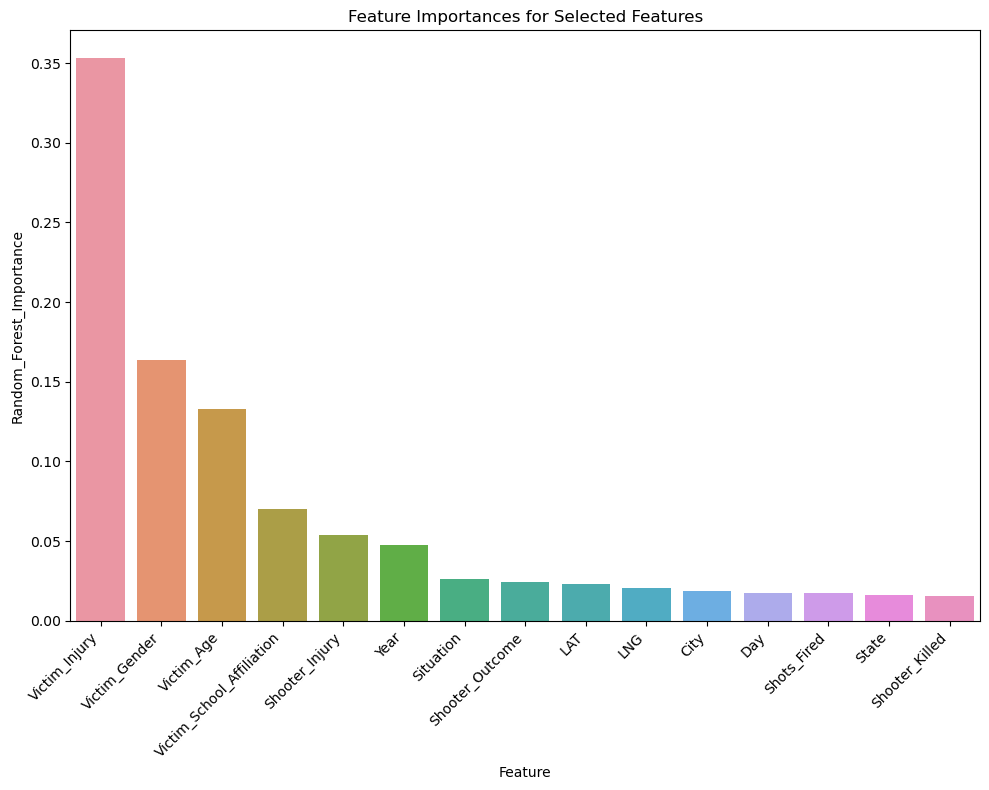

In [51]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier


# Assume Random Forest as Estimator
num_features_to_keep = 15
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=num_features_to_keep)
rfe.fit(X_train, y_train)

selected_features_mask = rfe.support_
selected_features = X_train.columns[selected_features_mask]
feature_importances = rfe.estimator_.feature_importances_


selected_features_df = pd.DataFrame({
    'Feature': selected_features,
    'Random_Forest_Importance': feature_importances
})


selected_features_df = selected_features_df.sort_values(by='Random_Forest_Importance', ascending=False)
plt.figure(figsize=(10, 8))
sns.barplot(data=selected_features_df, x='Feature', y='Random_Forest_Importance')
plt.title('Feature Importances for Selected Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Training Model with all features

In [52]:
categorical_columns = df.select_dtypes(include=['object','category']).columns
unique_counts = df[categorical_columns].nunique()

In [53]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from category_encoders import CountEncoder

X = df.drop('Has_Victims', axis=1)
y = df['Has_Victims']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

# store encoders
label_encoders = {}
count_encoders = {}

for col in categorical_columns:
    if unique_counts[col] > 3:
        # Count encoding
        count_encoders[col] = CountEncoder()
        X_train[col] = count_encoders[col].fit_transform(X_train[col])
        X_test[col] = count_encoders[col].transform(X_test[col])
    else:
        # Label encoding
        label_encoders[col] = LabelEncoder()
        X_train[col] = label_encoders[col].fit_transform(X_train[col])
        X_test[col] = X_test[col].map(lambda s: 'Unknown' if s not in label_encoders[col].classes_ else s)
        label_encoders[col].classes_ = np.append(label_encoders[col].classes_, 'Unknown')
        X_test[col] = label_encoders[col].transform(X_test[col])

In [54]:
X_test.head()

,Month,Day,Year,School,Shooter_Killed,Media_Attention,Reliability,Quarter,City,State,School_Level,Location,During_Classes,Time_Period,Duration_min,Situation,Involves_Students_Staff,Targets,Accomplice,Hostages,Barricade,Officer_Involved,Bullied,Domestic_Violence,Gang_Related,Active_Shooter_FBI,Shots_Fired,LAT,LNG,Shooter_Age,Shooter_Gender,Shooter_Race,Shooter_School_Affiliation,Shooter_Outcome,Shooter_Died,Shooter_Injury,No_of_Shooters,Victim_Injury,Victim_Gender,Victim_School_Affiliation,Victim_Age,Victim_Race,Weapon_Type,First_Shot,Weekday
1967,147,4,1993,0.0,0,985,2,633,0.0,15,1162,488,0,149,1.0,325,3,896,0,0,0,0,0,0,2,3,523,41.649791,-72.778114,432,1429,49,229,1241,1707,1626,1,330,986,798,826,1696.0,355,387,325
2002,180,18,1993,0.0,0,985,4,493,0.0,23,1162,506,2,330,21.0,54,3,439,0,2,2,0,2,0,0,2,206,38.324572,-82.933512,932,1429,161,834,165,1707,1626,1,330,163,130,382,1696.0,1223,610,307
1886,138,15,1996,1.0,0,985,1,510,33.0,34,1162,295,2,149,1.0,728,3,284,0,0,0,0,0,0,3,3,523,38.914536,-77.004906,473,377,1418,229,101,1707,1626,1,330,986,798,382,1696.0,355,387,307
2023,250,11,1992,1.0,0,985,3,633,2.0,157,1162,506,2,406,1.0,728,3,439,0,0,0,0,0,0,0,3,206,35.227216,-101.823659,932,1429,1418,834,1241,1707,1626,1,745,986,798,826,1696.0,1223,447,419
1381,138,16,2013,0.0,1,985,2,510,0.0,157,1162,20,2,406,1.0,199,2,896,0,0,0,0,0,0,0,3,790,31.106354,-97.353054,932,1429,1418,834,149,161,141,1,649,986,798,826,1696.0,1223,387,355


#### Scaling the data

In [55]:
from sklearn.preprocessing import StandardScaler
# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train)

# Scale both the training and test sets
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 1. Logistic Regression with all features

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.65      0.66       227
           1       0.80      0.81      0.81       402

    accuracy                           0.75       629
   macro avg       0.73      0.73      0.73       629
weighted avg       0.75      0.75      0.75       629



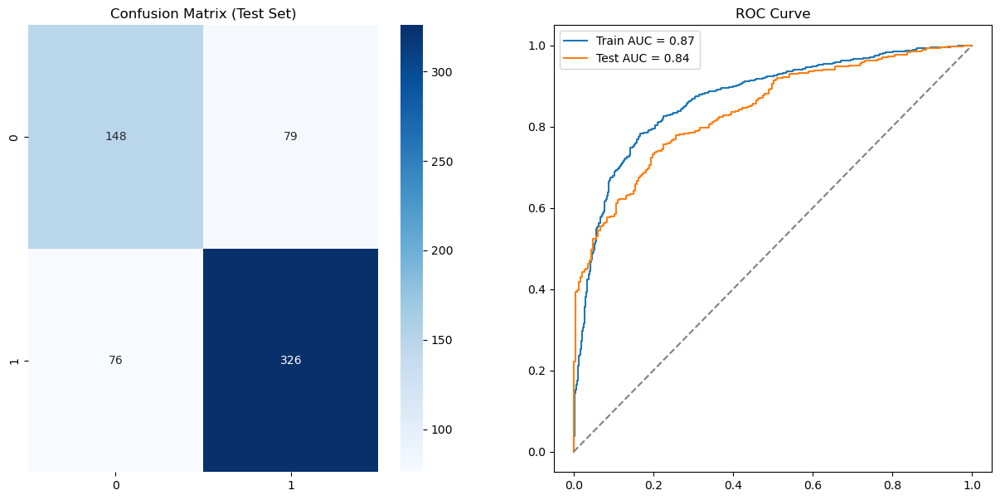

In [56]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc, classification_report


# Train the model
logistic_regression = LogisticRegression(random_state=42, class_weight='balanced').fit(X_train_scaled, y_train)

# Predictions
predictions_train = logistic_regression.predict(X_train_scaled)
predictions_test = logistic_regression.predict(X_test_scaled)

# Metrics
metrics = {
    "Accuracy": accuracy_score(y_test, predictions_test),
    "Precision": precision_score(y_test, predictions_test),
    "Recall": recall_score(y_test, predictions_test),
    "F1-Score": f1_score(y_test, predictions_test),
    "ROC-AUC": roc_auc_score(y_test, logistic_regression.predict_proba(X_test_scaled)[:, 1])
}
print("Classification Report:\n", classification_report(y_test, predictions_test))

# ROC Curve data
fpr_train, tpr_train, _ = roc_curve(y_train, logistic_regression.predict_proba(X_train_scaled)[:, 1])
fpr_test, tpr_test, _ = roc_curve(y_test, logistic_regression.predict_proba(X_test_scaled)[:, 1])
roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

# Plotting
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, predictions_test), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix (Test Set)')
plt.subplot(1, 2, 2)
plt.plot(fpr_train, tpr_train, label=f'Train AUC = {roc_auc_train:.2f}')
plt.plot(fpr_test, tpr_test, label=f'Test AUC = {roc_auc_test:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()

#### 2. Support Vector With all Features

Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.71      0.68       227
           1       0.83      0.78      0.80       402

    accuracy                           0.75       629
   macro avg       0.74      0.74      0.74       629
weighted avg       0.76      0.75      0.76       629



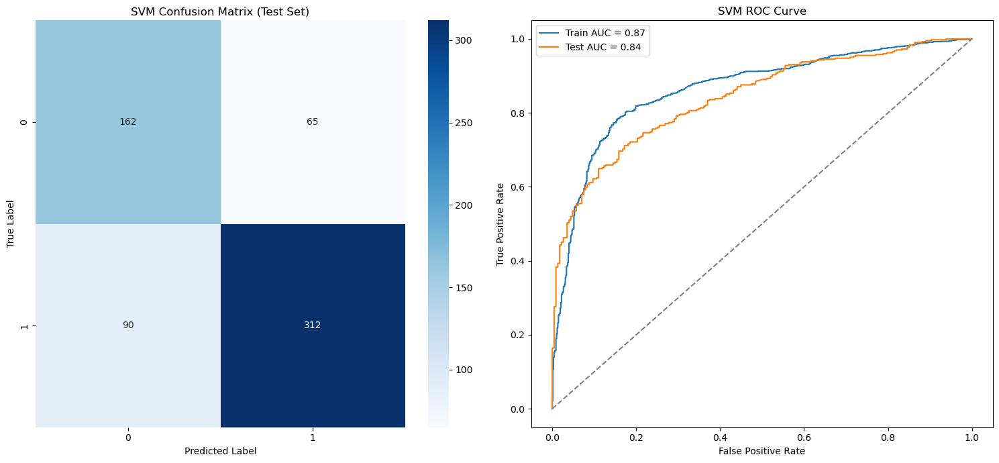

In [57]:
from sklearn.svm import SVC
# Train the SVM model
svm_model = SVC(probability=True, random_state=42, kernel='linear', C= 3, tol = 0.01, class_weight = 'balanced').fit(X_train_scaled, y_train)

# Predictions
predictions_train = svm_model.predict(X_train_scaled)
predictions_test = svm_model.predict(X_test_scaled)

# Classification report
print("Classification Report:\n", classification_report(y_test, predictions_test))

# ROC Curve data
fpr_train, tpr_train, _ = roc_curve(y_train, svm_model.predict_proba(X_train_scaled)[:, 1])
fpr_test, tpr_test, _ = roc_curve(y_test, svm_model.predict_proba(X_test_scaled)[:, 1])
roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

# Plotting
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, predictions_test), annot=True, cmap='Blues', fmt='g')
plt.title('SVM Confusion Matrix (Test Set)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.subplot(1, 2, 2)
plt.plot(fpr_train, tpr_train, label=f'Train AUC = {roc_auc_train:.2f}')
plt.plot(fpr_test, tpr_test, label=f'Test AUC = {roc_auc_test:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('SVM ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

In [63]:
X_train.columns

Index(['Month', 'Day', 'Year', 'School', 'Shooter_Killed', 'Media_Attention',
       'Reliability', 'Quarter', 'City', 'State', 'School_Level', 'Location',
       'During_Classes', 'Time_Period', 'Duration_min', 'Situation',
       'Involves_Students_Staff', 'Targets', 'Accomplice', 'Hostages',
       'Barricade', 'Officer_Involved', 'Bullied', 'Domestic_Violence',
       'Gang_Related', 'Active_Shooter_FBI', 'Shots_Fired', 'LAT', 'LNG',
       'Shooter_Age', 'Shooter_Gender', 'Shooter_Race',
       'Shooter_School_Affiliation', 'Shooter_Outcome', 'Shooter_Died',
       'Shooter_Injury', 'No_of_Shooters', 'Victim_Injury', 'Victim_Gender',
       'Victim_School_Affiliation', 'Victim_Age', 'Victim_Race', 'Weapon_Type',
       'First_Shot', 'Weekday'],
      dtype='object')

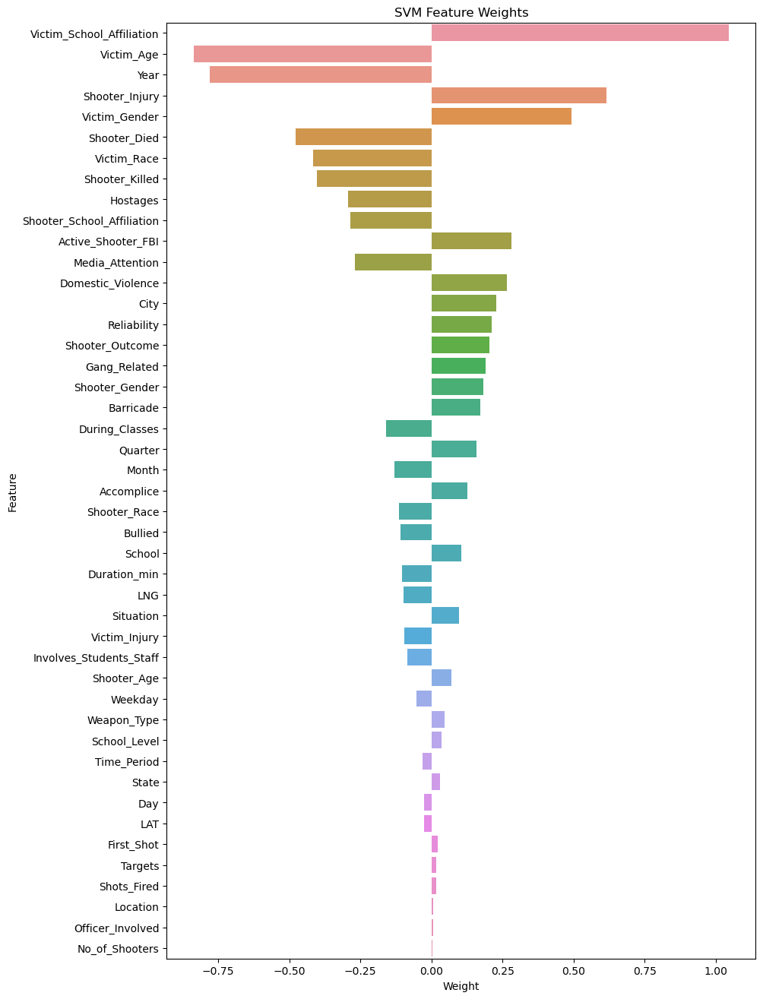

In [66]:
# Feature names (replace with your actual feature names)
feature_names = X_train.columns

# Accessing feature weights
feature_weights = svm_model.coef_[0]

# Create a DataFrame for easy plotting
features_df = pd.DataFrame({'Feature': feature_names, 'Weight': feature_weights})

# Sorting the features by their absolute weights
features_df = features_df.reindex(features_df.Weight.abs().sort_values(ascending=False).index)

# Plotting feature weights
plt.figure(figsize=(10,16))
sns.barplot(x='Weight', y='Feature', data=features_df)
plt.title('SVM Feature Weights')
plt.xlabel('Weight')
plt.ylabel('Feature')
plt.show()

In [62]:
# Accessing feature weights
feature_weights = svm_model.coef_

# Display the feature weights
print("Feature Weights:\n", feature_weights)

Feature Weights:
 [[-0.13149001 -0.0268359  -0.77901413  0.10383648 -0.40143822 -0.26913705
   0.2127942   0.1586811   0.22834385  0.02942223  0.03449861  0.00736804
  -0.15892881 -0.03214323 -0.10229177  0.09658045 -0.08548519  0.01633566
   0.12564299 -0.29434627  0.17290802  0.00554385 -0.10920361  0.26483694
   0.18971051  0.28232517  0.0159098  -0.02592281 -0.09919657  0.06934294
   0.18360096 -0.11409755 -0.28582552  0.20343238 -0.47652508  0.61619862
   0.00226346 -0.09640115  0.49120615  1.04588195 -0.83655478 -0.41649639
   0.04490667  0.02093785 -0.0531725 ]]


#### Now Training the model with Best Features

In [67]:
important_columns = ['Shooter_Outcome', 'Shooter_Injury', 'Situation', 'Victim_School_Affiliation', 'Victim_Gender',
                     'Victim_Race', 'Shooter_Died' ,'Shooter_Gender','Shooter_Race','School_Level', 'Weapon_Type', 'Targets',
                    'Victim_Injury','City','Media_Attention','Day', 'Year','Shooter_Killed', 'Reliability', 'Duration_min',
                     'LAT', 'LNG','Has_Victims']

In [68]:
df_bestf = df.copy()

In [69]:
df_bestf  = df_bestf [important_columns]

Splitting and Encoding Data

In [70]:
categorical_columns = df_bestf.select_dtypes(include=['object','category']).columns
unique_counts = df_bestf[categorical_columns].nunique()

In [71]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from category_encoders import CountEncoder

X = df_bestf.drop('Has_Victims', axis=1)
y = df_bestf['Has_Victims']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

# store encoders
label_encoders = {}
count_encoders = {}

for col in categorical_columns:
    if unique_counts[col] > 3:
        # Count encoding
        count_encoders[col] = CountEncoder()
        X_train[col] = count_encoders[col].fit_transform(X_train[col])
        X_test[col] = count_encoders[col].transform(X_test[col])
    else:
        # Label encoding
        label_encoders[col] = LabelEncoder()
        X_train[col] = label_encoders[col].fit_transform(X_train[col])
        X_test[col] = X_test[col].map(lambda s: 'Unknown' if s not in label_encoders[col].classes_ else s)
        label_encoders[col].classes_ = np.append(label_encoders[col].classes_, 'Unknown')
        X_test[col] = label_encoders[col].transform(X_test[col])

Scaling the Data

In [72]:
from sklearn.preprocessing import StandardScaler
# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train)

# Scale both the training and test sets
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 1. Logistic Regression With Best Features

Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.85      0.73       227
           1       0.89      0.74      0.81       402

    accuracy                           0.78       629
   macro avg       0.77      0.79      0.77       629
weighted avg       0.80      0.78      0.78       629



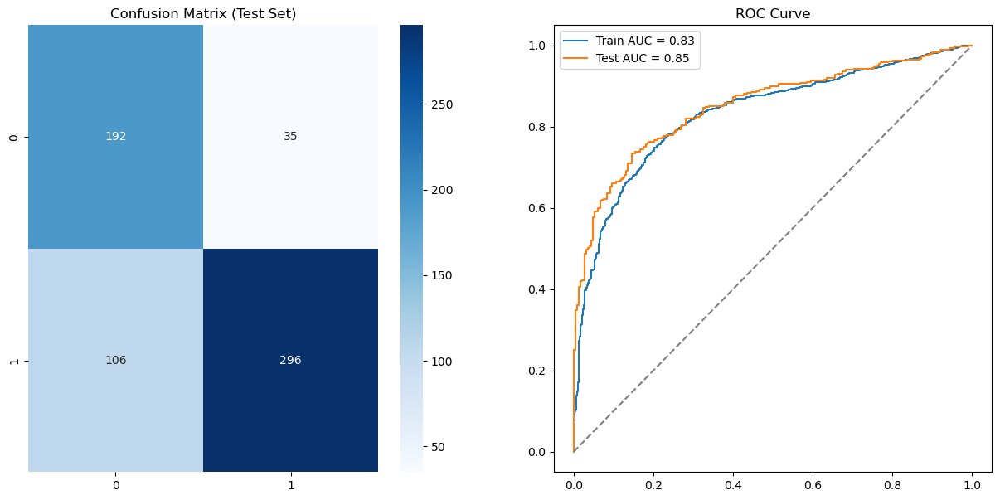

In [73]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc, classification_report


# Train the model
logistic_regression = LogisticRegression(random_state=42, class_weight='balanced', solver = 'saga', 
                                         max_iter = 1000, C = 3.0, tol = 0.0001).fit(X_train_scaled, y_train)

# Predictions
predictions_train = logistic_regression.predict(X_train_scaled)
predictions_test = logistic_regression.predict(X_test_scaled)

# Metrics
metrics = {
    "Accuracy": accuracy_score(y_test, predictions_test),
    "Precision": precision_score(y_test, predictions_test),
    "Recall": recall_score(y_test, predictions_test),
    "F1-Score": f1_score(y_test, predictions_test),
    "ROC-AUC": roc_auc_score(y_test, logistic_regression.predict_proba(X_test_scaled)[:, 1])
}
print("Classification Report:\n", classification_report(y_test, predictions_test))

# ROC Curve data
fpr_train, tpr_train, _ = roc_curve(y_train, logistic_regression.predict_proba(X_train_scaled)[:, 1])
fpr_test, tpr_test, _ = roc_curve(y_test, logistic_regression.predict_proba(X_test_scaled)[:, 1])
roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

# Plotting
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, predictions_test), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix (Test Set)')
plt.subplot(1, 2, 2)
plt.plot(fpr_train, tpr_train, label=f'Train AUC = {roc_auc_train:.2f}')
plt.plot(fpr_test, tpr_test, label=f'Test AUC = {roc_auc_test:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()

#### 2. Support Vector Machine with Best Features

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.89      0.82       227
           1       0.93      0.84      0.88       402

    accuracy                           0.86       629
   macro avg       0.84      0.86      0.85       629
weighted avg       0.87      0.86      0.86       629



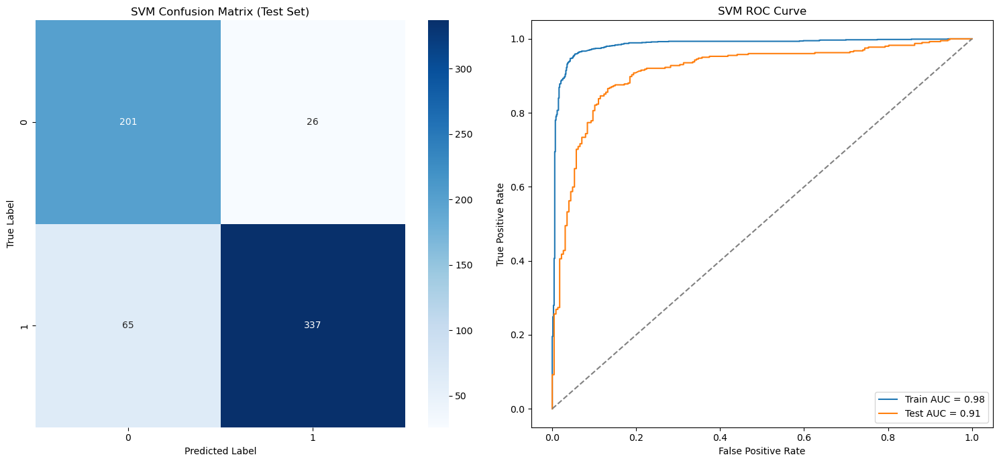

In [78]:
# Support Vector Model
svm_model = SVC(probability=True, random_state=42, kernel='poly', C= 3, tol = 0.001, class_weight = 'balanced').fit(X_train_scaled, y_train)

# Predictions
predictions_train = svm_model.predict(X_train_scaled)
predictions_test = svm_model.predict(X_test_scaled)

# Classification report
print("Classification Report:\n", classification_report(y_test, predictions_test))

# ROC Curve data
fpr_train, tpr_train, _ = roc_curve(y_train, svm_model.predict_proba(X_train_scaled)[:, 1])
fpr_test, tpr_test, _ = roc_curve(y_test, svm_model.predict_proba(X_test_scaled)[:, 1])
roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

# Plotting
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, predictions_test), annot=True, cmap='Blues', fmt='g')
plt.title('SVM Confusion Matrix (Test Set)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.subplot(1, 2, 2)
plt.plot(fpr_train, tpr_train, label=f'Train AUC = {roc_auc_train:.2f}')
plt.plot(fpr_test, tpr_test, label=f'Test AUC = {roc_auc_test:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('SVM ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

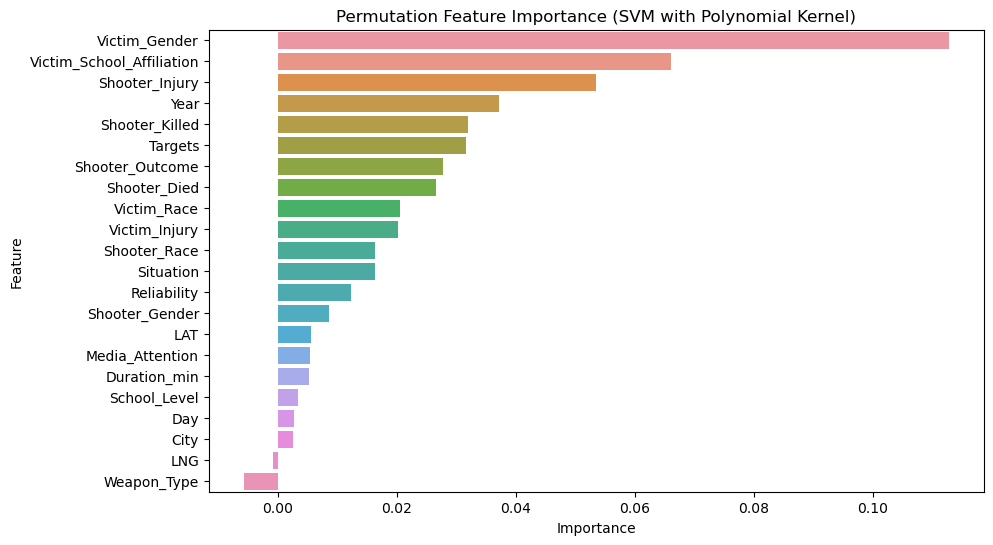

In [82]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(svm_model, X_test_scaled, y_test, n_repeats=10, random_state=42)

# Get feature names
feature_names = X_train.columns

# Store results in a DataFrame
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': perm_importance.importances_mean})

# Sort by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Permutation Feature Importance (SVM with Polynomial Kernel)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()